# Extract GPS coordinates from Garmin Activity for PPM Measurements

## 1. Import and set-up

In [8]:
#%%capture
#!pip install fitparse

In [13]:
#%%capture
#!pip install pytz

In [20]:
#%%capture
#!pip install folium

In [26]:
from datetime import timezone
import pandas as pd
import numpy as np
import os
from fitparse import FitFile
import folium
from datetime import timezone
from zoneinfo import ZoneInfo 
import math

In [3]:
local_fit_path = "SUP_20250831.fit"  #"SUP_20250824.fit"  # <-- change this
ff = FitFile(local_fit_path)


In [4]:
# set timezone

CET = ZoneInfo("Europe/Zurich")

In [1]:
import selenium
import fitparse
import folium

print(f"Selenium version: {selenium.__version__}")
print(f"Fitparse version: {fitparse.__version__}")
print(f"Folium version: {folium.__version__}")

Selenium version: 4.31.0
Fitparse version: 1.2.0
Folium version: 0.20.0


## 2. Export GPS coordinates for every second

In [5]:
# Conversion: Garmin semicircles -> degrees
def semicircles_to_degrees(semicircles):
    return semicircles * (180.0 / 2**31)


In [6]:
def clean_records_to_df(records):
    """
    Turn FIT 'record' messages into a DataFrame with both UTC and CET timestamps.
    Index is UTC. Also includes lat/lon (deg), altitude, speed, HR, heading.
    """
    rows = []
    for r in records:
        ts = r.get("timestamp")
        if ts is None:
            continue

        # FIT timestamps are UTC. If tz-naive, localize to UTC; then convert to CET for display.
        ts_utc = ts.replace(tzinfo=timezone.utc) if ts.tzinfo is None else ts.astimezone(timezone.utc)
        ts_cet = ts_utc.astimezone(CET)

        lat_sc = r.get("position_lat")
        lon_sc = r.get("position_long")
        alt = r.get("enhanced_altitude") or r.get("altitude")
        spd = r.get("enhanced_speed") or r.get("speed")
        hr  = r.get("heart_rate")
        hdg = r.get("heading")

        rows.append({
            "timestamp_utc": ts_utc,
            "timestamp_cet": ts_cet,
            "position_lat_sc": lat_sc,
            "position_long_sc": lon_sc,
            "altitude_m": alt,
            "speed_m_s": spd,
            "heart_rate_bpm": hr,
            "heading_deg": hdg
        })

    df = pd.DataFrame(rows)
    if df.empty:
        return df

    # Convert semicircles → degrees (safe with NaNs)
    df["lat_deg"] = semicircles_to_degrees(df["position_lat_sc"].astype("float"))
    df["lon_deg"] = semicircles_to_degrees(df["position_long_sc"].astype("float"))

    # Sort and set UTC index for downstream processing/interpolation
    df = df.sort_values("timestamp_utc").set_index("timestamp_utc")
    df.index.name = "timestamp_utc"
    return df

In [7]:
def clean_records_to_df(records):
    """
    Turn FIT record messages into a clean DataFrame.
    """
    rows = []
    for r in records:
        ts = r.get("timestamp")
        if ts is None:
            continue
        lat = r.get("position_lat")
        lon = r.get("position_long")
        alt = r.get("enhanced_altitude") or r.get("altitude")
        spd = r.get("enhanced_speed") or r.get("speed")
        hr  = r.get("heart_rate")
        hdg = r.get("heading")
        rows.append({
            "timestamp": ts.replace(tzinfo=timezone.utc) if ts.tzinfo is None else ts.astimezone(timezone.utc),
            "position_lat_sc": lat,
            "position_long_sc": lon,
            "altitude_m": alt,
            "speed_m_s": spd,
            "heart_rate_bpm": hr,
            "heading_deg": hdg
        })
    df = pd.DataFrame(rows)
    if df.empty:
        return df
    # Convert semicircles to degrees
    df["lat_deg"] = semicircles_to_degrees(df["position_lat_sc"].astype(float))
    df["lon_deg"] = semicircles_to_degrees(df["position_long_sc"].astype(float))
    return df.sort_values("timestamp").set_index("timestamp")

In [8]:
def resample_to_1hz(df):
    """
    Resample irregular FIT data to 1Hz using linear interpolation.
    """
    if df.empty:
        return df
    idx = pd.date_range(start=df.index.min().ceil("S"),
                        end=df.index.max().floor("S"),
                        freq="1S", tz=timezone.utc)
    num_cols = ["lat_deg", "lon_deg", "altitude_m", "speed_m_s", "heart_rate_bpm", "heading_deg"]
    existing = [c for c in num_cols if c in df.columns]
    out = df[existing].reindex(idx).interpolate(method="time").ffill().bfill()
    out.index.name = "timestamp_utc"

    # ✅ add local time as a separate column
    out["timestamp_cet"] = out.index.tz_convert(CET)
    
    return out

In [16]:
records = [{d.name: d.value for d in msg} for msg in ff.get_messages("record")]

df = clean_records_to_df(records)
print("Raw FIT points:", len(df))
display(df.head())

# Optional: resample to 1 Hz
df_1s = resample_to_1hz(df)
print("Resampled points (1Hz):", len(df_1s))
display(df_1s.head())

# Save to CSV
out_csv = os.path.splitext(local_fit_path)[0] + "_gps_1hz.csv"
df_1s.to_csv(out_csv, float_format="%.9f")
print("Saved CSV:", os.path.abspath(out_csv))

Raw FIT points: 1953


,position_lat_sc,position_long_sc,altitude_m,speed_m_s,heart_rate_bpm,heading_deg,lat_deg,lon_deg
timestamp,,,,,,,,
2025-08-31 04:40:26+00:00,NaN,NaN,None,NaN,86,None,NaN,NaN
2025-08-31 04:40:27+00:00,NaN,NaN,None,NaN,85,None,NaN,NaN
2025-08-31 04:40:29+00:00,NaN,NaN,None,NaN,82,None,NaN,NaN
2025-08-31 04:40:39+00:00,557157378.0,92289243.0,None,2.36,80,None,46.700392,7.735595
2025-08-31 04:40:44+00:00,557156673.0,92288582.0,None,NaN,83,None,46.700333,7.735540


Resampled points (1Hz): 10800


C:\Users\A\AppData\Local\Temp\ipykernel_34544\3798614242.py:7: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  idx = pd.date_range(start=df.index.min().ceil("S"),
C:\Users\A\AppData\Local\Temp\ipykernel_34544\3798614242.py:8: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  end=df.index.max().floor("S"),
C:\Users\A\AppData\Local\Temp\ipykernel_34544\3798614242.py:12: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  out = df[existing].reindex(idx).interpolate(method="time").ffill().bfill()


,lat_deg,lon_deg,altitude_m,speed_m_s,heart_rate_bpm,heading_deg,timestamp_cet
timestamp_utc,,,,,,,
2025-08-31 04:40:26+00:00,46.700392,7.735595,None,2.36,86.0,None,2025-08-31 06:40:26+02:00
2025-08-31 04:40:27+00:00,46.700392,7.735595,None,2.36,85.0,None,2025-08-31 06:40:27+02:00
2025-08-31 04:40:28+00:00,46.700392,7.735595,None,2.36,83.5,None,2025-08-31 06:40:28+02:00
2025-08-31 04:40:29+00:00,46.700392,7.735595,None,2.36,82.0,None,2025-08-31 06:40:29+02:00
2025-08-31 04:40:30+00:00,46.700392,7.735595,None,2.36,81.8,None,2025-08-31 06:40:30+02:00


Saved CSV: C:\Users\A\Documents\XX_GitHub_Repo\data-waves\ppm_experiment\SUP_20250831_gps_1hz.csv


### Plot raw extracted data

In [17]:
# ---------- Helper: load or use existing df ----------
def load_raw_df(default_csv="your_activity_raw.csv"):
    try:
        # If df already exists in the notebook, reuse it
        _ = df  # type: ignore
        print("Using in-memory DataFrame: df (raw).")
        return df  # noqa: F821
    except NameError:
        if os.path.exists(default_csv):
            print(f"Loading raw data from: {default_csv}")
            d = pd.read_csv(default_csv, parse_dates=True)
            # Try to find timestamp column if present
            for c in ["timestamp", "timestamp_utc", "time", "datetime"]:
                if c in d.columns:
                    d[c] = pd.to_datetime(d[c], utc=True, errors="coerce")
                    d = d.set_index(c)
                    break
            return d
        else:
            raise SystemExit(
                "No in-memory df found and no CSV at 'your_activity_raw.csv'. "
                "Either define `df` or change the filename."
            )

def center_latlon(d):
    return float(d["lat_deg"].mean()), float(d["lon_deg"].mean())

def to_latlon_sequence(d):
    return list(zip(d["lat_deg"].astype(float), d["lon_deg"].astype(float)))

In [18]:
# ---------- Load raw ----------
raw = load_raw_df()

# Basic sanity checks
for col in ["lat_deg", "lon_deg"]:
    if col not in raw.columns:
        raise SystemExit(f"Missing '{col}' in raw DataFrame.")

# Drop NaNs
raw_clean = raw[["lat_deg", "lon_deg"]].dropna()

if raw_clean.empty:
    raise SystemExit("Raw track has no valid lat/lon rows.")


Using in-memory DataFrame: df (raw).


In [19]:
# ---------- Build folium map ----------
lat_c, lon_c = center_latlon(raw_clean)
m_raw = folium.Map(location=[lat_c, lon_c], zoom_start=14, tiles="OpenStreetMap")

# Add track as a polyline
folium.PolyLine(to_latlon_sequence(raw_clean), weight=4).add_to(m_raw)

# Start & End markers
start_lat, start_lon = raw_clean.iloc[0][["lat_deg", "lon_deg"]].tolist()
end_lat, end_lon = raw_clean.iloc[-1][["lat_deg", "lon_deg"]].tolist()
folium.Marker([start_lat, start_lon], tooltip="Start").add_to(m_raw)
folium.Marker([end_lat, end_lon], tooltip="End").add_to(m_raw)

# Show in notebook and save to HTML
m_raw
# Optionally save:
m_raw.save(os.path.splitext(local_fit_path)[0] + "_map_raw_track.html")
print("Saved: map_raw_track.html")

Saved: map_raw_track.html


In [20]:
m_raw

### Plot interpolated data

In [21]:
# ---------- Helper: load or use existing df_1s ----------
def load_interp_df(default_csv="your_activity_gps_1hz.csv"):
    try:
        _ = df_1s  # type: ignore
        print("Using in-memory DataFrame: df_1s (interpolated).")
        return df_1s  # noqa: F821
    except NameError:
        if os.path.exists(default_csv):
            print(f"Loading interpolated data from: {default_csv}")
            d = pd.read_csv(default_csv, parse_dates=True)
            # Try to find timestamp column if present
            for c in ["timestamp", "timestamp_utc", "time", "datetime"]:
                if c in d.columns:
                    d[c] = pd.to_datetime(d[c], utc=True, errors="coerce")
                    d = d.set_index(c)
                    break
            return d
        else:
            raise SystemExit(
                "No in-memory df_1s found and no CSV at 'your_activity_gps_1hz.csv'. "
                "Either define `df_1s` or change the filename."
            )

def center_latlon(d):
    return float(d["lat_deg"].mean()), float(d["lon_deg"].mean())

def to_latlon_sequence(d):
    return list(zip(d["lat_deg"].astype(float), d["lon_deg"].astype(float)))


In [22]:
# ---------- Load interpolated ----------
interp = load_interp_df()

# Basic sanity checks
for col in ["lat_deg", "lon_deg"]:
    if col not in interp.columns:
        raise SystemExit(f"Missing '{col}' in interpolated DataFrame.")

interp_clean = interp[["lat_deg", "lon_deg"]].dropna()
if interp_clean.empty:
    raise SystemExit("Interpolated track has no valid lat/lon rows.")

Using in-memory DataFrame: df_1s (interpolated).


In [23]:
# ---------- Build folium map ----------
lat_c, lon_c = center_latlon(interp_clean)
m_interp = folium.Map(location=[lat_c, lon_c], zoom_start=14, tiles="OpenStreetMap")

# Add track as a polyline (1 point per second)
folium.PolyLine(to_latlon_sequence(interp_clean), weight=3).add_to(m_interp)

# Start & End markers
start_lat, start_lon = interp_clean.iloc[0][["lat_deg", "lon_deg"]].tolist()
end_lat, end_lon = interp_clean.iloc[-1][["lat_deg", "lon_deg"]].tolist()
folium.Marker([start_lat, start_lon], tooltip="Start (1 Hz)").add_to(m_interp)
folium.Marker([end_lat, end_lon], tooltip="End (1 Hz)").add_to(m_interp)

# Show in notebook and save to HTML
m_interp
# Optionally save:
m_interp.save(os.path.splitext(local_fit_path)[0] + "_map_interpolated_1hz.html")
print("Saved: map_interpolated_1hz.html")

Saved: map_interpolated_1hz.html


In [24]:
m_interp

In [25]:
# ---------- Combined map with raw (red) + interpolated (blue) ----------
lat_c = float(raw_clean["lat_deg"].mean())
lon_c = float(raw_clean["lon_deg"].mean())
m_combined = folium.Map(location=[lat_c, lon_c], zoom_start=14, tiles="OpenStreetMap")

# Raw track in RED
folium.PolyLine(
    list(zip(raw_clean["lat_deg"], raw_clean["lon_deg"])),
    color="red", weight=4, opacity=0.8, tooltip="Raw track"
).add_to(m_combined)

# Interpolated track in BLUE
folium.PolyLine(
    list(zip(interp_clean["lat_deg"], interp_clean["lon_deg"])),
    color="blue", weight=2, opacity=0.8, tooltip="Interpolated 1 Hz"
).add_to(m_combined)

# Start & End markers (from raw data)
start_lat, start_lon = raw_clean.iloc[0][["lat_deg", "lon_deg"]].tolist()
end_lat, end_lon = raw_clean.iloc[-1][["lat_deg", "lon_deg"]].tolist()
folium.Marker([start_lat, start_lon], tooltip="Start").add_to(m_combined)
folium.Marker([end_lat, end_lon], tooltip="End").add_to(m_combined)

# Show in notebook
m_combined

# Save to file (optional)
m_combined.save(os.path.splitext(local_fit_path)[0] + "_map_raw_vs_interpolated.html")

In [26]:
# Show in notebook
m_combined

## 2. Extract and plot values at every 10 minutes

In [27]:
# --- Use the already-loaded interpolated data and map ---
base_df = interp_clean.copy()

# Ensure CET/CEST index (Europe/Zurich)
if base_df.index.tz is None:
    # FIT/our pipeline is UTC by default if tz-naive → localize to UTC, then convert
    base_df = base_df.tz_localize("UTC").tz_convert("Europe/Zurich")
else:
    base_df = base_df.tz_convert("Europe/Zurich")


In [28]:
# Select exact 10-minute marks in CET: …:00, …:10, …:20, …:30, …:40, …:50 (second == 0)
idx = base_df.index
mask_10min = (idx.second == 0) & (idx.minute % 10 == 0)
df_10min = base_df.loc[mask_10min].copy()

if df_10min.empty:
    raise SystemExit("No 10-minute marks found (CET). Ensure interp_clean is 1 Hz and spans :00 seconds.")


In [29]:
# --- Add pins to the EXISTING interpolated map (m_interp) ---
for t, row in df_10min.iterrows():
    lat, lon = float(row["lat_deg"]), float(row["lon_deg"])
    popup_text = (
        f"Time (CET): {t.strftime('%Y-%m-%d %H:%M:%S %Z')}<br>"
        f"Lat: {lat:.6f}, Lon: {lon:.6f}"
    )
    tooltip_text = f"{t.strftime('%H:%M:%S')}  ({lat:.5f}, {lon:.5f})"
    folium.Marker([lat, lon], popup=popup_text, tooltip=tooltip_text).add_to(m_interp)

# Show updated map and save
m_interp.save(os.path.splitext(local_fit_path)[0] + "_map_interpolated_with_10min_pins_CET.html")
print("Saved map: map_interpolated_with_10min_pins_CET.html")
m_interp

Saved map: map_interpolated_with_10min_pins_CET.html


In [11]:
from pyproj import Transformer

# Your point (WGS84) on 2025.08.31 at 06:50 am
lat = 46.695547
lon = 7.735120

# Define transformer: WGS84 -> LV95 (CH1903+)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:2056", always_xy=True)

# Perform transformation (lon, lat order!)
easting, northing = transformer.transform(lon, lat)

print(f"Easting (LV95): {easting:.5f} m")
print(f"Northing (LV95): {northing:.5f} m")

Easting (LV95): 2622677.43544 m
Northing (LV95): 1171635.04414 m


In [30]:
# Keep only available columns + keep CET index
cols = [c for c in ["lat_deg","lon_deg","altitude_m","speed_m_s","heart_rate_bpm","heading_deg"] if c in df_10min.columns]
table_cet = df_10min[cols].copy()
table_cet.index.name = "timestamp_cet"

display(table_cet)
out_csv = os.path.splitext(local_fit_path)[0] + "_interpolated_10min_points_CET.csv"
table_cet.to_csv(out_csv, float_format="%.9f")
print("Saved table:", os.path.abspath(out_csv))

,lat_deg,lon_deg
timestamp_cet,,
2025-08-31 06:50:00+02:00,46.695975,7.736535
2025-08-31 07:00:00+02:00,46.696030,7.736394
2025-08-31 07:10:00+02:00,46.696219,7.736530
2025-08-31 07:20:00+02:00,46.695787,7.736310
2025-08-31 07:30:00+02:00,46.695750,7.735693
2025-08-31 07:40:00+02:00,46.695815,7.735718
2025-08-31 07:50:00+02:00,46.695738,7.735831
2025-08-31 08:00:00+02:00,46.695928,7.736191
2025-08-31 08:10:00+02:00,46.695927,7.735960


Saved table: C:\Users\A\Documents\XX_GitHub_Repo\data-waves\ppm_experiment\SUP_20250831_interpolated_10min_points_CET.csv


## 3. Creating GPX file for the second experiment to be followed on Garmin watch

In [31]:
#%%capture
#!pip install gpxpy

In [32]:
#%%capture
#!pip install geographiclib

In [33]:
import gpxpy
import gpxpy.gpx
import math
import numpy as np
from geographiclib.geodesic import Geodesic

In [34]:
# Setting up parameter

TARGET_LAT = 46.69619
TARGET_LON = 7.73660
N_POINTS   = 20
STEP_M     = 5.0
FLIP_PERP  = False

OUTPUT_GPX = "planned_SUP_measure_line.gpx"
WGS84 = Geodesic.WGS84

In [35]:
# Start point comes from your DataFrame you already have in memory:
start_lat = float(base_df.iloc[0]["lat_deg"])
start_lon = float(base_df.iloc[0]["lon_deg"])

In [36]:
# Define the building edge of Beatus Wellness Hotel
# Replace these two points with precise coordinates along the building’s long edge (facade).
# You can pick them in any map tool by clicking two corners along the facade line.
BUILDING_P1_LAT = 46.696627   # <-- REPLACE with precise corner 1
BUILDING_P1_LON = 7.737162    # <-- REPLACE with precise corner 1
BUILDING_P2_LAT = 46.695920   # <-- REPLACE with precise corner 2
BUILDING_P2_LON = 7.737717    # <-- REPLACE with precise corner 2

In [37]:
# Estimate shoreline bearing near target
# ----------------------------
def initial_bearing_deg(lat1, lon1, lat2, lon2):
    inv = WGS84.Inverse(lat1, lon1, lat2, lon2)
    return (inv['azi1'] + 360.0) % 360.0

def dest_point(lat, lon, bearing_deg, distance_m):
    dirn = WGS84.Direct(lat, lon, bearing_deg, distance_m)
    return dirn['lat2'], dirn['lon2']

In [38]:
# Bearing of the building edge (P1 -> P2)

building_bearing = initial_bearing_deg(BUILDING_P1_LAT, BUILDING_P1_LON,
                                       BUILDING_P2_LAT, BUILDING_P2_LON)

# Perpendicular (orthogonal) to the building edge
perp_bearing = (building_bearing + (270 if FLIP_PERP else 90)) % 360

In [39]:
# Should be ~90° (or ~270°) difference
diff = (perp_bearing - building_bearing) % 360
print(f"Angle between facade and measure line: {diff:.1f}°")  # expect ~90.0 or ~270.0

Angle between facade and measure line: 90.0°


In [40]:
# Build measuring points along that perpendicular 
measure_points = []
for k in range(N_POINTS):
    dist_m = k * STEP_M  # 0, STEP_M, 2*STEP_M, ...
    lat_k, lon_k = dest_point(TARGET_LAT, TARGET_LON, perp_bearing, dist_m)
    measure_points.append((lat_k, lon_k))


In [41]:
# Count of points to confirm single line
print("Measure points:", len(measure_points))  # expect 15

Measure points: 20


In [42]:
# Build GPX track

# Always start with a fresh container
gpx_new = gpxpy.gpx.GPX()
gpx_new.name = "SUP Measure Line (⊥ Beatus Hotel facade)"

# (optional safety if you keep the object around)
gpx_new.tracks.clear()
gpx_new.waypoints.clear()

trk = gpxpy.gpx.GPXTrack(name="Measure Line Track")
gpx_new.tracks.append(trk)
seg = gpxpy.gpx.GPXTrackSegment()
trk.segments.append(seg)

# Start (from DataFrame)

seg.points.append(gpxpy.gpx.GPXTrackPoint(start_lat, start_lon))

# Target
seg.points.append(gpxpy.gpx.GPXTrackPoint(TARGET_LAT, TARGET_LON))

# Measurement points
for (lat, lon) in measure_points:
    seg.points.append(gpxpy.gpx.GPXTrackPoint(lat, lon))

# Back to Start
seg.points.append(gpxpy.gpx.GPXTrackPoint(start_lat, start_lon))

# Add waypoints for visibility
for i, (lat, lon) in enumerate(measure_points, start=1):
    gpx_new.waypoints.append(
        gpxpy.gpx.GPXWaypoint(latitude=lat, longitude=lon, name=f"P{i:02d}")
    )

# Save GPX

with open(OUTPUT_GPX, "w", encoding="utf-8") as f:
    f.write(gpx_new.to_xml())

print("Created:", OUTPUT_GPX)
print("Start from DataFrame:", start_lat, start_lon)
print("Target:", TARGET_LAT, TARGET_LON)
print("Shore bearing:", shore_bearing, "→ Perp:", perp_bearing)

Created: planned_SUP_measure_line.gpx
Start from DataFrame: 46.70039193704724 7.7355949860066175
Target: 46.69619 7.7366


NameError: name 'shore_bearing' is not defined

In [43]:
# ---- Load the created GPX ----
with open(OUTPUT_GPX, "r", encoding="utf-8") as f:
    gpx_vis = gpxpy.parse(f)

# Collect track coordinates (first track/segment)
trk_pts = []
if gpx_vis.tracks and gpx_vis.tracks[0].segments:
    seg = gpx_vis.tracks[0].segments[0]
    for p in seg.points:
        trk_pts.append((p.latitude, p.longitude))
else:
    raise SystemExit("No track/segment found in OUTPUT_GPX.")

# Collect waypoints (P01..P15) if present
wps = []
for w in gpx_vis.waypoints:
    wps.append((w.latitude, w.longitude, w.name or "WP"))

# Center map on the mean of track points
clat = sum(lat for lat, _ in trk_pts) / len(trk_pts)
clon = sum(lon for _, lon in trk_pts) / len(trk_pts)

gpx_map = folium.Map(location=[clat, clon], zoom_start=15, tiles="OpenStreetMap")

# Feature groups for toggling
fg_track = folium.FeatureGroup(name="Track").add_to(gpx_map)
fg_wps = folium.FeatureGroup(name="Waypoints").add_to(gpx_map)

# Draw the track polyline
folium.PolyLine(trk_pts, color="blue", weight=4, opacity=0.9, tooltip="Planned SUP course").add_to(fg_track)

# Markers: start & end
start_lat, start_lon = trk_pts[0]
end_lat, end_lon = trk_pts[-1]
folium.Marker([start_lat, start_lon], tooltip="Start", icon=folium.Icon(color="green")).add_to(fg_track)
folium.Marker([end_lat, end_lon], tooltip="End", icon=folium.Icon(color="red")).add_to(fg_track)

# Optional: highlight the explicit target if you still have TARGET_LAT/LON in memory
try:
    folium.Marker([TARGET_LAT, TARGET_LON], tooltip="Target", icon=folium.Icon(color="orange", icon="star")).add_to(fg_track)
except NameError:
    pass

# Waypoint markers (P01..P15)
for lat, lon, name in wps:
    folium.Marker([lat, lon],
                  tooltip=name,
                  popup=f"{name}<br>Lat: {lat:.6f}, Lon: {lon:.6f}",
                  icon=folium.Icon(color="blue", icon="flag")).add_to(fg_wps)

# Layer control & display
folium.LayerControl().add_to(gpx_map)
gpx_map

In [44]:
# Show updated map and save
gpx_map.save("gpx-map_SUP_experiment.html")

### Plot desired gpx track and completed real-word gpx trac from SUP activity

In [45]:
# --- Collect all coords to set map bounds (use full interpolated track + GPX track) ---
interp_coords = list(zip(base_df["lat_deg"].astype(float), base_df["lon_deg"].astype(float)))
all_coords = interp_coords + trk_pts
if not all_coords:
    raise SystemExit("No coordinates available to plot.")

# Center & map
clat = sum(lat for lat, _ in all_coords) / len(all_coords)
clon = sum(lon for _, lon in all_coords) / len(all_coords)
m_combined = folium.Map(location=[clat, clon], zoom_start=15, tiles="OpenStreetMap")

# Feature groups for toggling
fg_interp = folium.FeatureGroup(name="Interpolated (10-min pins, blue)").add_to(m_combined)
fg_gpx    = folium.FeatureGroup(name="GPX track (points + line, red)").add_to(m_combined)
fg_wps    = folium.FeatureGroup(name="Waypoints (from GPX)").add_to(m_combined)

# --- 1) GPX: red polyline + red point markers ---
# Thin red line for the route
folium.PolyLine(trk_pts, color="red", weight=2, opacity=0.8, tooltip="GPX track").add_to(fg_gpx)

# Red point markers for each GPX track point (use small circles)
for lat, lon in trk_pts:
    folium.CircleMarker([lat, lon], radius=2, color="red", fill=True, fill_opacity=0.9).add_to(fg_gpx)

# Start/End markers (keep green/red icons for clarity)
start_lat, start_lon = trk_pts[0]
end_lat, end_lon = trk_pts[-1]
folium.Marker([start_lat, start_lon], tooltip="Start", icon=folium.Icon(color="green")).add_to(fg_gpx)
folium.Marker([end_lat, end_lon], tooltip="End", icon=folium.Icon(color="red")).add_to(fg_gpx)

# Optional target marker if variable exists
try:
    folium.Marker([TARGET_LAT, TARGET_LON], tooltip="Target", icon=folium.Icon(color="orange", icon="star")).add_to(fg_gpx)
except NameError:
    pass

# GPX waypoints (show as red flags)
for lat, lon, name in wps:
    folium.Marker([lat, lon],
                  tooltip=name,
                  popup=f"{name}<br>Lat: {lat:.6f}, Lon: {lon:.6f}",
                  icon=folium.Icon(color="red", icon="flag")).add_to(fg_wps)

# --- 2) Interpolated 10-minute pins (blue) with your CET time/lat/lon popups ---
for t, row in df_10min.iterrows():
    lat, lon = float(row["lat_deg"]), float(row["lon_deg"])
    popup_text = (
        f"Time (CET): {t.strftime('%Y-%m-%d %H:%M:%S %Z')}<br>"
        f"Lat: {lat:.6f}, Lon: {lon:.6f}"
    )
    tooltip_text = f"{t.strftime('%H:%M:%S')}  ({lat:.5f}, {lon:.5f})"
    folium.Marker([lat, lon],
                  popup=popup_text,
                  tooltip=tooltip_text,
                  icon=folium.Icon(color="blue")).add_to(fg_interp)

# Fit bounds to everything
min_lat = min(lat for lat, _ in all_coords)
max_lat = max(lat for lat, _ in all_coords)
min_lon = min(lon for _, lon in all_coords)
max_lon = max(lon for _, lon in all_coords)
m_combined.fit_bounds([[min_lat, min_lon], [max_lat, max_lon]])

# Layer control & display
folium.LayerControl().add_to(m_combined)

# Save & show
combined_html = "map_gpx_red__interp_blue.html"
m_combined.save(combined_html)
print("Saved map:", combined_html)
m_combined

Saved map: map_gpx_red__interp_blue.html


In [176]:
# --- Collect all coords for map bounds ---
interp_coords = list(zip(base_df["lat_deg"].astype(float), base_df["lon_deg"].astype(float)))
all_coords = interp_coords + trk_pts
if not all_coords:
    raise SystemExit("No coordinates available to plot.")

# Center
clat = sum(lat for lat, _ in all_coords) / len(all_coords)
clon = sum(lon for _, lon in all_coords) / len(all_coords)
m_combined = folium.Map(location=[clat, clon], zoom_start=15, tiles="OpenStreetMap")

# Feature groups
fg_interp_line = folium.FeatureGroup(name="Interpolated track (blue)").add_to(m_combined)
fg_interp_pins = folium.FeatureGroup(name="10-min pins (blue)").add_to(m_combined)
fg_gpx_line    = folium.FeatureGroup(name="GPX track (red)").add_to(m_combined)
fg_wps         = folium.FeatureGroup(name="GPX waypoints").add_to(m_combined)

# --- 1) GPX track (red line + red points) ---
folium.PolyLine(trk_pts, color="red", weight=2, opacity=0.8, tooltip="GPX track").add_to(fg_gpx_line)
for lat, lon in trk_pts:
    folium.CircleMarker([lat, lon], radius=2, color="red", fill=True, fill_opacity=0.9).add_to(fg_gpx_line)

start_lat, start_lon = trk_pts[0]
end_lat, end_lon = trk_pts[-1]
folium.Marker([start_lat, start_lon], tooltip="Start (GPX)", icon=folium.Icon(color="green")).add_to(fg_gpx_line)
folium.Marker([end_lat, end_lon], tooltip="End (GPX)", icon=folium.Icon(color="red")).add_to(fg_gpx_line)

try:
    folium.Marker([TARGET_LAT, TARGET_LON], tooltip="Target", icon=folium.Icon(color="orange", icon="star")).add_to(fg_gpx_line)
except NameError:
    pass

for lat, lon, name in wps:
    folium.Marker([lat, lon],
                  tooltip=name,
                  popup=f"{name}<br>Lat: {lat:.6f}, Lon: {lon:.6f}",
                  icon=folium.Icon(color="red", icon="flag")).add_to(fg_wps)

# --- 2) Interpolated track line (blue) ---
folium.PolyLine(interp_coords, color="blue", weight=3, opacity=0.8, tooltip="Interpolated track").add_to(fg_interp_line)

# --- 3) Interpolated 10-min pins (blue markers with CET popup) ---
for t, row in df_10min.iterrows():
    lat, lon = float(row["lat_deg"]), float(row["lon_deg"])
    popup_text = (
        f"Time (CET): {t.strftime('%Y-%m-%d %H:%M:%S %Z')}<br>"
        f"Lat: {lat:.6f}, Lon: {lon:.6f}"
    )
    tooltip_text = f"{t.strftime('%H:%M:%S')}  ({lat:.5f}, {lon:.5f})"
    folium.Marker([lat, lon],
                  popup=popup_text,
                  tooltip=tooltip_text,
                  icon=folium.Icon(color="blue")).add_to(fg_interp_pins)

# --- Fit bounds ---
min_lat = min(lat for lat, _ in all_coords)
max_lat = max(lat for lat, _ in all_coords)
min_lon = min(lon for _, lon in all_coords)
max_lon = max(lon for _, lon in all_coords)
m_combined.fit_bounds([[min_lat, min_lon], [max_lat, max_lon]])

# Add layer control
folium.LayerControl().add_to(m_combined)

# Save & show
combined_html = "map_gpx_red__interp_blue_withpins.html"
m_combined.save(combined_html)
print("Saved map:", combined_html)
m_combined

Saved map: map_gpx_red__interp_blue_withpins.html


### Visualize selected PPM Points

In [5]:
import folium

# Define the list of coordinates (latitude, longitude)
coordinates = [
    (46.695975, 7.736535),
    (46.696030, 7.736394),
    (46.695787, 7.736310),
    (46.695927, 7.735960),
    (46.695815, 7.735718),
    (46.695750, 7.735693),
    (46.695539, 7.735528),
    (46.695665, 7.735123),
    (46.695547, 7.735120),
]

# Compute the center of the map
center_lat = sum(lat for lat, lon in coordinates) / len(coordinates)
center_lon = sum(lon for lat, lon in coordinates) / len(coordinates)

# Create a Folium map centered around the points
m = folium.Map(location=[center_lat, center_lon], zoom_start=18)

# Add markers for each coordinate
for i, (lat, lon) in enumerate(coordinates, start=1):
    folium.Marker(
        location=[lat, lon],
        popup=f"Point {i}: ({lat:.6f}, {lon:.6f})",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)

# Optionally draw a line connecting the points
folium.PolyLine(coordinates, color='red', weight=2.5, opacity=0.8).add_to(m)

# Display the map
m

Average pixel-per-meter in area: 22.68 px/m
Standard deviation: 8.46 px/m
Average meter-per-pixel in area: 0.04409 m/px (4.41 cm/px)

Linear fit: ppm(y) = 0.05071 * y + -65.01


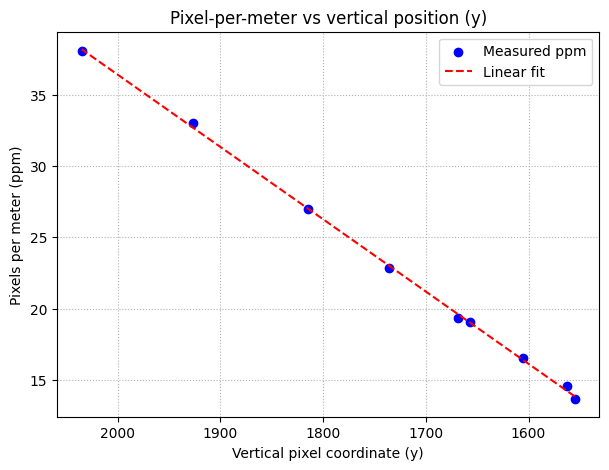

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Known real-world length of the SUP board (meters) ---
BOARD_LENGTH_M = 3.15

output_plot_path = "plot_ppm_field_experiment_datapoints.jpg"

# --- Your measurement table ---
data = [
    ("2025-08-31-0650", 2035, 4647, 4767, 120),
    ("2025-08-31-0700", 1927, 4140, 4244, 104),
    ("2025-08-31-0720", 1815, 3837, 3922, 85),
    ("2025-08-31-0810", 1736, 4285, 4357, 72),
    ("2025-08-31-0740", 1669, 4207, 4268, 61),
    ("2025-08-31-0730", 1657, 4148, 4208, 60),
    ("2025-08-31-0820", 1605, 4138, 4190, 52),
    ("2025-08-31-0840", 1563, 4441, 4487, 46),
    ("2025-08-31-0830", 1555, 4316, 4359, 43),
]

df = pd.DataFrame(data, columns=["datetime", "y", "x_start", "x_end", "px_len"])

# Derived quantities
df["ppm"] = df["px_len"] / BOARD_LENGTH_M
df["m_per_px"] = 1 / df["ppm"]
df["x_center"] = (df["x_start"] + df["x_end"]) / 2

# --- Define area of interest ---
X_MIN, X_MAX = 3837, 4767
Y_MIN, Y_MAX = 1555, 2035

area_df = df[
    (df["x_start"] >= X_MIN)
    & (df["x_end"] <= X_MAX)
    & (df["y"] >= Y_MIN)
    & (df["y"] <= Y_MAX)
].copy()

mean_ppm = area_df["ppm"].mean()
std_ppm = area_df["ppm"].std()
mean_mpp = 1 / mean_ppm

print(f"Average pixel-per-meter in area: {mean_ppm:.2f} px/m")
print(f"Standard deviation: {std_ppm:.2f} px/m")
print(f"Average meter-per-pixel in area: {mean_mpp:.5f} m/px ({mean_mpp*100:.2f} cm/px)")

# --- Fit simple linear regression for ppm vs y ---
coeffs = np.polyfit(area_df["y"], area_df["ppm"], 1)
a, b = coeffs

print(f"\nLinear fit: ppm(y) = {a:.5f} * y + {b:.2f}")

# Evaluate model
y_fit = np.linspace(Y_MIN, Y_MAX, 100)
ppm_fit = np.polyval(coeffs, y_fit)

# --- Plot ---
plt.figure(figsize=(7,5))
plt.scatter(area_df["y"], area_df["ppm"], color="blue", label="Measured ppm")
plt.plot(y_fit, ppm_fit, color="red", linestyle="--", label="Linear fit")
plt.gca().invert_xaxis()  # optional: because y increases downward in image coordinates
plt.xlabel("Vertical pixel coordinate (y)")
plt.ylabel("Pixels per meter (ppm)")
plt.title("Pixel-per-meter vs vertical position (y)")
plt.grid(True, linestyle=":")
plt.legend()
plt.savefig(output_plot_path, dpi=300, bbox_inches='tight')
plt.show()

In [7]:
import math

# --- 1. Helper: horizontal distance from lat/lon (haversine, good for up to a few km) ---
def haversine_distance_m(lat1_deg, lon1_deg, lat2_deg, lon2_deg):
    """
    Great-circle distance between two lat/lon points (in meters).
    Good enough for typical camera-to-board distances.
    """
    R = 6371000.0  # Earth radius in meters (approx)
    lat1 = math.radians(lat1_deg)
    lon1 = math.radians(lon1_deg)
    lat2 = math.radians(lat2_deg)
    lon2 = math.radians(lon2_deg)
    
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    
    a = (
        math.sin(dlat / 2) ** 2
        + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2) ** 2
    )
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    return R * c

# --- 2. Geometry-based error estimate ---
def wave_height_scale_error(camera_lat, camera_lon,
                            board_lat, board_lon,
                            camera_height_m,
                            wave_heights_m):
    """
    Compute relative error when using water-plane px/m calibration
    to measure wave heights at the board location.
    
    camera_height_m: height of camera above water surface (m)
    wave_heights_m:  iterable of wave heights to test (m)
    """
    # Horizontal distance from camera to board
    D = haversine_distance_m(camera_lat, camera_lon, board_lat, board_lon)
    
    # Distance from camera to water at board position
    R0 = math.sqrt(D**2 + camera_height_m**2)
    
    print(f"Horizontal distance D ≈ {D:.2f} m")
    print(f"Line-of-sight distance to water R0 ≈ {R0:.2f} m\n")
    
    results = []
    for h in wave_heights_m:
        # Distance to wave crest at height h
        Rh = math.sqrt(D**2 + (camera_height_m - h)**2)
        
        # Scale ∝ 1/R; relative error when using 1/R0 instead of 1/Rh
        rel_error = abs(1.0/R0 - 1.0/Rh) / (1.0/Rh)
        
        # sign: if 1/R0 < 1/Rh, we underestimate true height
        sign = "underestimate" if (1.0/R0 < 1.0/Rh) else "overestimate"
        
        print(
            f"Wave height h = {h:.2f} m:"
            f"\n  R(h) ≈ {Rh:.2f} m"
            f"\n  Relative error ≈ {rel_error*100:.2f}% ({sign})\n"
        )
        results.append((h, Rh, rel_error))
    
    return results

# --- 3. EXAMPLE: fill in your real numbers here ---

camera_lat  = 46.696404   # <-- replace with your camera latitude
camera_lon  = 7.737336    # <-- replace with your camera longitude
board_lat   = 46.695927  # <-- replace with board center latitude
board_lon   = 7.735960    # <-- replace with board center longitude
camera_height_m = 14.0    # height of camera above water in meters (572-558)

wave_heights_m = [0.1, 0.5, 1.0]  # typical wave heights you care about

wave_height_scale_error(
    camera_lat, camera_lon,
    board_lat, board_lon,
    camera_height_m,
    wave_heights_m
)

Horizontal distance D ≈ 117.58 m
Line-of-sight distance to water R0 ≈ 118.41 m

Wave height h = 0.10 m:
  R(h) ≈ 118.40 m
  Relative error ≈ 0.01% (underestimate)

Wave height h = 0.50 m:
  R(h) ≈ 118.36 m
  Relative error ≈ 0.05% (underestimate)

Wave height h = 1.00 m:
  R(h) ≈ 118.30 m
  Relative error ≈ 0.10% (underestimate)



[(0.1, 118.40172821853854, 9.94931788199948e-05),
 (0.5, 118.35543606077698, 0.0004904296347658062),
 (1.0, 118.2994473576976, 0.0009632532449247107)]

In [8]:
# Filled in with board coordinates closest to the camera

board_lat   = 46.695975   # <-- replace with board center latitude
board_lon   = 7.736535    # <-- replace with board center longitude

wave_height_scale_error(
    camera_lat, camera_lon,
    board_lat, board_lon,
    camera_height_m,
    wave_heights_m
)

Horizontal distance D ≈ 77.51 m
Line-of-sight distance to water R0 ≈ 78.76 m

Wave height h = 0.10 m:
  R(h) ≈ 78.74 m
  Relative error ≈ 0.02% (underestimate)

Wave height h = 0.50 m:
  R(h) ≈ 78.67 m
  Relative error ≈ 0.11% (underestimate)

Wave height h = 1.00 m:
  R(h) ≈ 78.59 m
  Relative error ≈ 0.22% (underestimate)



[(0.1, 78.74336125860134, 0.00022490534518074045),
 (0.5, 78.67373730987106, 0.0011088946595746814),
 (1.0, 78.58948366227251, 0.002178631805112734)]

In [9]:
# Filled in with board coordinates most far in my selected range to the camera

board_lat   = 46.695547   # <-- replace with board center latitude
board_lon   = 7.735120    # <-- replace with board center longitude

wave_height_scale_error(
    camera_lat, camera_lon,
    board_lat, board_lon,
    camera_height_m,
    wave_heights_m
)

Horizontal distance D ≈ 194.02 m
Line-of-sight distance to water R0 ≈ 194.52 m

Wave height h = 0.10 m:
  R(h) ≈ 194.52 m
  Relative error ≈ 0.00% (underestimate)

Wave height h = 0.50 m:
  R(h) ≈ 194.49 m
  Relative error ≈ 0.02% (underestimate)

Wave height h = 1.00 m:
  R(h) ≈ 194.45 m
  Relative error ≈ 0.04% (underestimate)



[(0.1, 194.51584870588144, 3.6867204284115e-05),
 (0.5, 194.48767415383773, 0.0001817063704198247),
 (1.0, 194.4536073148795, 0.0003568364857075089)]

In [10]:
import math
import pandas as pd

# ----------------------------------------------------
# 1. Haversine distance (horizontal distance, in meters)
# ----------------------------------------------------
def haversine_distance_m(lat1_deg, lon1_deg, lat2_deg, lon2_deg):
    """
    Great-circle distance between two lat/lon points (in meters).
    Good enough for typical camera-to-board distances.
    """
    R = 6371000.0  # Earth radius in meters (approx)
    lat1 = math.radians(lat1_deg)
    lon1 = math.radians(lon1_deg)
    lat2 = math.radians(lat2_deg)
    lon2 = math.radians(lon2_deg)

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = (
        math.sin(dlat / 2) ** 2
        + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2) ** 2
    )
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    return R * c


# ----------------------------------------------------
# 2. Camera parameters (Lake Thun setup)
# ----------------------------------------------------
camera_lat = 46.696404   # camera latitude
camera_lon = 7.737336    # camera longitude
camera_height_m = 14.0   # camera height above water (m)

# ----------------------------------------------------
# 3. ROI levels (near, mid, far) with board coordinates
#    -> taken from your SUP dataset
# ----------------------------------------------------
roi_points = [
    {
        "label": "Near (upper ROI)",
        "y_px": 2035,
        "board_lat": 46.695975,
        "board_lon": 7.736535,
    },
    {
        "label": "Middle ROI",
        "y_px": 1736,
        "board_lat": 46.695927,
        "board_lon": 7.735960,
    },
    {
        "label": "Far (lower ROI)",
        "y_px": 1555,
        "board_lat": 46.695547,
        "board_lon": 7.735120,
    },
]

# Wave heights you want to evaluate
wave_heights_m = [0.1, 0.5, 1.0]

# ----------------------------------------------------
# 4. Compute geometric error for each ROI & wave height
# ----------------------------------------------------
rows = []

for roi in roi_points:
    # Horizontal distance from camera to board at this ROI
    D = haversine_distance_m(
        camera_lat,
        camera_lon,
        roi["board_lat"],
        roi["board_lon"],
    )

    # Line-of-sight distance to water surface at this ROI
    R0 = math.sqrt(D**2 + camera_height_m**2)

    for h in wave_heights_m:
        # Distance to crest at height h
        Rh = math.sqrt(D**2 + (camera_height_m - h) ** 2)

        # Relative error when using water-plane scale instead of true crest distance
        rel_error = abs(1.0 / R0 - 1.0 / Rh) / (1.0 / Rh)  # fraction
        rel_error_pct = rel_error * 100.0

        rows.append(
            {
                "ROI level": roi["label"],
                "y (px)": roi["y_px"],
                "Wave height h (m)": h,
                "Horizontal distance D (m)": D,
                "LOS distance R0 (m)": R0,
                "Crest distance R(h) (m)": Rh,
                "Relative error (%)": rel_error_pct,
            }
        )

# Create DataFrame
df = pd.DataFrame(rows)

# Nicely rounded values for presentation
df_rounded = df.copy()
df_rounded["Horizontal distance D (m)"] = df_rounded["Horizontal distance D (m)"].round(2)
df_rounded["LOS distance R0 (m)"] = df_rounded["LOS distance R0 (m)"].round(2)
df_rounded["Crest distance R(h) (m)"] = df_rounded["Crest distance R(h) (m)"].round(2)
df_rounded["Relative error (%)"] = df_rounded["Relative error (%)"].round(3)

# Show the table in the notebook
df_rounded.style.to_html('table.html')
df_rounded

,ROI level,y (px),Wave height h (m),Horizontal distance D (m),LOS distance R0 (m),Crest distance R(h) (m),Relative error (%)
0,Near (upper ROI),2035,0.1,77.51,78.76,78.74,0.022
1,Near (upper ROI),2035,0.5,77.51,78.76,78.67,0.111
2,Near (upper ROI),2035,1.0,77.51,78.76,78.59,0.218
3,Middle ROI,1736,0.1,117.58,118.41,118.40,0.010
4,Middle ROI,1736,0.5,117.58,118.41,118.36,0.049
5,Middle ROI,1736,1.0,117.58,118.41,118.30,0.096
6,Far (lower ROI),1555,0.1,194.02,194.52,194.52,0.004
7,Far (lower ROI),1555,0.5,194.02,194.52,194.49,0.018
8,Far (lower ROI),1555,1.0,194.02,194.52,194.45,0.036


In [11]:
# ----------------------------------------------------
# 5. Export table (CSV + LaTeX)
# ----------------------------------------------------
csv_path = "lake_thun_wave_height_error_table.csv"
tex_path = "lake_thun_wave_height_error_table.tex"

df_rounded.to_csv(csv_path, index=False)

latex_table = df_rounded.to_latex(
    index=False,
    float_format="%.3f",
    caption="Geometric scale error for different ROI levels and wave heights (Lake Thun setup).",
    label="tab:wave_height_error_lake_thun",
)

with open(tex_path, "w", encoding="utf-8") as f:
    f.write(latex_table)

print("CSV saved to:", csv_path)
print("LaTeX table saved to:", tex_path)
print("\nCopy-paste this LaTeX into your thesis:\n")
print(latex_table)

CSV saved to: lake_thun_wave_height_error_table.csv
LaTeX table saved to: lake_thun_wave_height_error_table.tex

Copy-paste this LaTeX into your thesis:

\begin{table}
\caption{Geometric scale error for different ROI levels and wave heights (Lake Thun setup).}
\label{tab:wave_height_error_lake_thun}
\begin{tabular}{lrrrrrr}
\toprule
ROI level & y (px) & Wave height h (m) & Horizontal distance D (m) & LOS distance R0 (m) & Crest distance R(h) (m) & Relative error (%) \\
\midrule
Near (upper ROI) & 2035 & 0.100 & 77.510 & 78.760 & 78.740 & 0.022 \\
Near (upper ROI) & 2035 & 0.500 & 77.510 & 78.760 & 78.670 & 0.111 \\
Near (upper ROI) & 2035 & 1.000 & 77.510 & 78.760 & 78.590 & 0.218 \\
Middle ROI & 1736 & 0.100 & 117.580 & 118.410 & 118.400 & 0.010 \\
Middle ROI & 1736 & 0.500 & 117.580 & 118.410 & 118.360 & 0.049 \\
Middle ROI & 1736 & 1.000 & 117.580 & 118.410 & 118.300 & 0.096 \\
Far (lower ROI) & 1555 & 0.100 & 194.020 & 194.520 & 194.520 & 0.004 \\
Far (lower ROI) & 1555 & 0.500 & 1

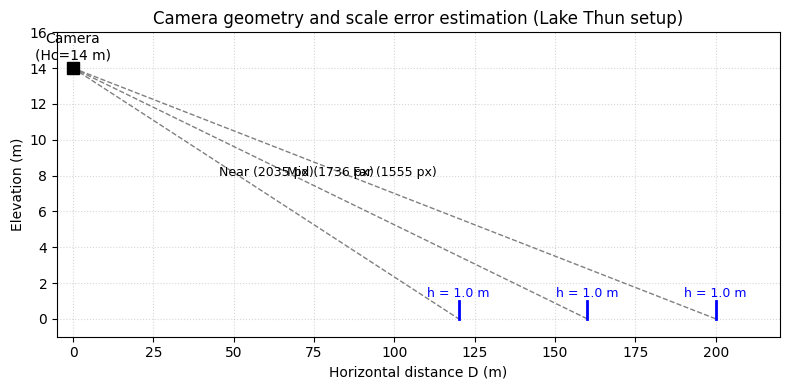

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Camera and geometry
Hc = 14  # camera height (m)
wave_heights = [0.1, 0.5, 1.0]
D_values = [120, 160, 200]  # example horizontal distances for near/mid/far ROI

fig, ax = plt.subplots(figsize=(8, 4))

for D, label in zip(D_values, ["Near (2035 px)", "Mid (1736 px)", "Far (1555 px)"]):
    # Water line
    ax.plot([0, D], [Hc, 0], color='gray', linestyle='--', lw=1)
    ax.text(D/2, Hc/2 + 1, label, fontsize=9, ha='center')
    
    # Draw wave crest
    h = 1.0
    ax.plot([D, D], [0, h], color='blue', lw=2)
    ax.text(D, h + 0.2, f"h = {h} m", color='blue', fontsize=9, ha='center')

# Camera symbol
ax.plot(0, Hc, 'ks', markersize=8)
ax.text(0, Hc + 0.5, "Camera\n(Hc=14 m)", fontsize=10, ha='center')

# Axes labels
ax.set_xlabel("Horizontal distance D (m)")
ax.set_ylabel("Elevation (m)")
ax.set_title("Camera geometry and scale error estimation (Lake Thun setup)")
ax.set_ylim(-1, 16)
ax.set_xlim(-5, 220)
ax.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

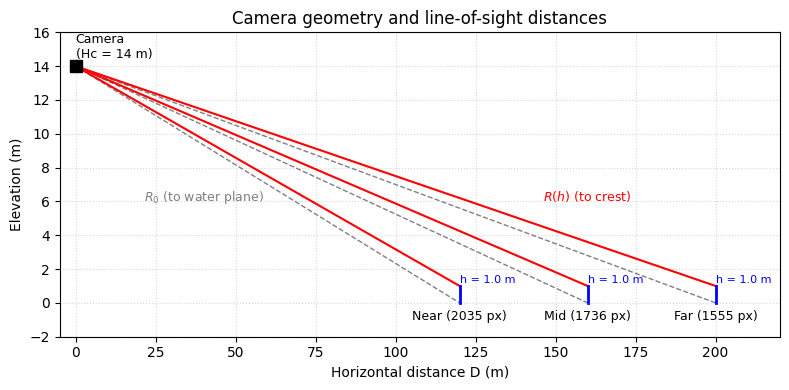

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Camera and geometry
Hc = 14   # camera height (m)
h  = 1.0  # example wave crest height (m)
D_values = [120, 160, 200]  # horizontal distances for near/mid/far ROI
labels   = ["Near (2035 px)", "Mid (1736 px)", "Far (1555 px)"]

fig, ax = plt.subplots(figsize=(8, 4))

for i, (D, label) in enumerate(zip(D_values, labels)):
    # Line of sight to water plane R0 (gray dashed)
    ax.plot([0, D], [Hc, 0], color='gray', linestyle='--', lw=1)

    # Line of sight to crest Rh (red solid)
    ax.plot([0, D], [Hc, h], color='red', linestyle='-', lw=1.5)

    # Wave crest vertical line
    ax.plot([D, D], [0, h], color='blue', lw=2)

    # ROI label near water line (staggered vertically to avoid overlap)
    ax.text(D, -0.5 - 0.5, label, fontsize=9, ha='center')

    # Crest height label
    ax.text(D, h + 0.2, f"h = {h} m", color='blue', fontsize=8, ha='left')

# Add R0 and R(h) text only at the middle distance to avoid clutter
D_mid = D_values[1]
ax.text(D_mid/4, 6, r"$R_0$ (to water plane)",
        color='gray', fontsize=9, ha='center')
ax.text(D_mid, 6, r"$R(h)$ (to crest)",
        color='red', fontsize=9, ha='center')

# Camera symbol
ax.plot(0, Hc, 'ks', markersize=8)
ax.text(0, Hc + 0.5, "Camera\n(Hc = 14 m)", fontsize=9, ha='left')

# Axes labels etc.
ax.set_xlabel("Horizontal distance D (m)")
ax.set_ylabel("Elevation (m)")
ax.set_title("Camera geometry and line-of-sight distances")
ax.set_ylim(-2, 16)
ax.set_xlim(-5, 220)
ax.grid(True, linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

In [14]:
fig.savefig("camera_wave_geometry_side_labels.png", dpi=300, bbox_inches="tight")

In [15]:
# Check how well ppm(y) reproduces the original ppm_i values
area_df["ppm_model"] = a * area_df["y"] + b
area_df["ppm_residual"] = area_df["ppm"] - area_df["ppm_model"]

# Convert to meters per pixel (inverse)
area_df["m_per_px_measured"] = 1 / area_df["ppm"]
area_df["m_per_px_model"] = 1 / area_df["ppm_model"]

# Print detailed table
print(area_df[[
    "datetime", "y", 
    "ppm", "ppm_model", "ppm_residual", 
    "m_per_px_measured", "m_per_px_model"
]])

# Compute RMS error (goodness of fit)
rms_residual = np.sqrt(np.mean(area_df["ppm_residual"]**2))
print(f"\nRMS residual (px/m): {rms_residual:.3f}")

          datetime     y        ppm  ppm_model  ppm_residual  \
0  2025-08-31-0650  2035  38.095238  38.193635     -0.098397   
1  2025-08-31-0700  1927  33.015873  32.716520      0.299354   
2  2025-08-31-0720  1815  26.984127  27.036548     -0.052421   
3  2025-08-31-0810  1736  22.857143  23.030139     -0.172996   
4  2025-08-31-0740  1669  19.365079  19.632299     -0.267220   
5  2025-08-31-0730  1657  19.047619  19.023731      0.023888   
6  2025-08-31-0820  1605  16.507937  16.386601      0.121335   
7  2025-08-31-0840  1563  14.603175  14.256612      0.346563   
8  2025-08-31-0830  1555  13.650794  13.850900     -0.200106   

   m_per_px_measured  m_per_px_model  
0           0.026250        0.026182  
1           0.030288        0.030566  
2           0.037059        0.036987  
3           0.043750        0.043421  
4           0.051639        0.050936  
5           0.052500        0.052566  
6           0.060577        0.061025  
7           0.068478        0.070143  
8       

In [99]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.signal import find_peaks

# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Area of interest (full-image pixel coords)
x_min, x_max = 3837, 4767
y_min, y_max = 1555, 2035
crop_box = (x_min, y_min, x_max + 1, y_max + 1)

# Image paths (use raw strings or forward slashes)
image_paths = [
    r"2025-08-31_experiment\img_2025_08_31_06_50_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_00_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_40_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_10_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_40_00.png",
]

# ---- Linear ppm model from your SUP-board calibration ----
# ppm(y) = a * y + b   (pixels per meter)
# >>>>>> REPLACE THESE TWO NUMBERS WITH YOUR REGRESSION COEFFICIENTS <<<<<<
#a_ppm = 0.05071  # example value, replace with your fitted slope
#b_ppm = -65.01   # example value, replace with your fitted intercept

# after running the calibration script
a_ppm, b_ppm = a, b  # reuse the fitted coefficients

def ppm_y(y_full):
    """Pixels-per-meter at full-image vertical coordinate y."""
    return a_ppm * y_full + b_ppm

# ---------------------------------------------------------
# 2. WAVE DETECTION PARAMETERS
# ---------------------------------------------------------

# How wide (in % of crop width) to average horizontally for vertical profile
profile_x_frac = (0.2, 0.8)   # use central 60% of cropped image

# Peak detection settings (you may need to tune these)
crest_prominence = 5          # intensity prominence for crests      ### TUNE THIS
trough_prominence = 5         # intensity prominence for troughs     ### TUNE THIS
min_wave_height_px = 3        # discard smaller than this (px)       ### TUNE THIS

# ---------------------------------------------------------
# 3. HELPER: extract vertical brightness profile & detect waves
# ---------------------------------------------------------

def extract_vertical_profile(cropped_img):
    """
    Convert cropped image to grayscale and compute a vertical brightness profile
    by averaging over a central horizontal band.
    Returns: profile (1D array), local_y indices (0 at top of crop).
    """
    gray = np.array(cropped_img.convert("L"))  # grayscale
    h, w = gray.shape

    x0 = int(w * profile_x_frac[0])
    x1 = int(w * profile_x_frac[1])
    band = gray[:, x0:x1]
    profile = band.mean(axis=1)  # one value per row (y position)

    local_y = np.arange(h)  # 0 .. h-1
    return profile, local_y

def detect_waves_from_profile(profile, local_y):
    """
    Detect crests and troughs from 1D brightness profile using scipy.signal.find_peaks.
    Returns a list of (y_trough, y_crest, height_px).
    """
    # Crests: local maxima in profile
    crest_idx, _ = find_peaks(profile, prominence=crest_prominence)
    # Troughs: local minima => peaks in inverted profile
    trough_idx, _ = find_peaks(-profile, prominence=trough_prominence)

    # Sort combined indices to pair trough–crest neighbours
    all_idx = np.sort(np.concatenate([crest_idx, trough_idx]))

    waves = []
    for i in range(len(all_idx) - 1):
        i0, i1 = all_idx[i], all_idx[i+1]

        # crest following trough
        if (i0 in trough_idx) and (i1 in crest_idx):
            y_trough = local_y[i0]
            y_crest = local_y[i1]
        # trough following crest
        elif (i0 in crest_idx) and (i1 in trough_idx):
            y_crest = local_y[i0]
            y_trough = local_y[i1]
        else:
            continue

        height_px = abs(y_crest - y_trough)
        if height_px >= min_wave_height_px:
            waves.append((y_trough, y_crest, height_px))

    return waves

# ---------------------------------------------------------
# 4. MAIN LOOP: process images, detect waves, convert to meters
# ---------------------------------------------------------

all_wave_rows = []

for path in image_paths:
    fname = os.path.basename(path)

    try:
        img = Image.open(path)
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    # 4.1 crop ROI
    cropped = img.crop(crop_box)

    # 4.2 extract vertical profile
    profile, local_y = extract_vertical_profile(cropped)

    # 4.3 detect waves in pixel space
    waves = detect_waves_from_profile(profile, local_y)

    # 4.4 convert each wave to meters using ppm(y_mid)
    for wave_id, (y_trough_local, y_crest_local, height_px) in enumerate(waves, start=1):
        y_mid_local = 0.5 * (y_trough_local + y_crest_local)

        # full-image y (add crop offset)
        y_mid_full = y_min + y_mid_local

        ppm_mid = ppm_y(y_mid_full)
        if ppm_mid <= 0:
            continue  # avoid nonsense if model is wrong at that y

        height_m = height_px / ppm_mid

        all_wave_rows.append(
            {
                "image": fname,
                "wave_id": wave_id,
                "y_trough_local_px": y_trough_local,
                "y_crest_local_px": y_crest_local,
                "y_mid_full_px": y_mid_full,
                "height_px": height_px,
                "ppm_at_y": ppm_mid,
                "height_m": height_m,
            }
        )

# ---------------------------------------------------------
# 5. Build table and compute significant wave height
# ---------------------------------------------------------

waves_df = pd.DataFrame(all_wave_rows)

if waves_df.empty:
    print("No waves detected with current parameters. Try lowering prominences or min_wave_height_px.")
else:
    # Sort table for readability
    waves_df = waves_df.sort_values(["image", "wave_id"]).reset_index(drop=True)
    display(waves_df)

    # Per-image summary (optional)
    summary = waves_df.groupby("image")["height_m"].agg(
        number_of_waves="count",
        mean_height_m="mean",
        max_height_m="max",
    )
    print("\nPer-image wave summary:")
    display(summary)

    # Significant wave height Hs (mean of highest 1/3)
    heights = waves_df["height_m"].dropna().values
    heights_sorted = np.sort(heights)[::-1]  # descending
    n = len(heights_sorted)
    n_top = max(1, n // 3)  # at least 1
    Hs = heights_sorted[:n_top].mean()

    print(f"\nTotal number of detected waves: {n}")
    print(f"Significant wave height Hs (mean of highest 1/3): {Hs:.3f} m")

,image,wave_id,y_trough_local_px,y_crest_local_px,y_mid_full_px,height_px,ppm_at_y,height_m
0,img_2025_08_31_06_50_00.png,1,377,420,1953.5,43,34.060441,1.262462
1,img_2025_08_31_06_50_00.png,2,466,420,1998.0,46,36.317216,1.266617
2,img_2025_08_31_07_00_00.png,1,283,287,1840.0,4,28.304399,0.141321
3,img_2025_08_31_07_00_00.png,2,371,287,1884.0,84,30.535816,2.750868
4,img_2025_08_31_07_00_00.png,3,378,372,1930.0,6,32.868662,0.182545
...,...,...,...,...,...,...,...,...
300,img_2025_08_31_08_40_00.png,42,444,432,1993.0,12,36.063646,0.332745
301,img_2025_08_31_08_40_00.png,43,444,448,2001.0,4,36.469358,0.109681
302,img_2025_08_31_08_40_00.png,44,451,448,2004.5,3,36.646857,0.081862
303,img_2025_08_31_08_40_00.png,45,451,454,2007.5,3,36.798999,0.081524



Per-image wave summary:


,number_of_waves,mean_height_m,max_height_m
image,,,
img_2025_08_31_06_50_00.png,2,1.264539,1.266617
img_2025_08_31_07_00_00.png,8,0.710062,2.750868
img_2025_08_31_07_20_00.png,13,0.611630,3.154300
img_2025_08_31_07_30_00.png,47,0.271000,1.216192
img_2025_08_31_07_40_00.png,54,0.323978,2.942251
img_2025_08_31_08_10_00.png,52,0.333191,0.854357
img_2025_08_31_08_20_00.png,43,0.368702,1.555088
img_2025_08_31_08_30_00.png,40,0.468685,2.377840
img_2025_08_31_08_40_00.png,46,0.408002,2.047883



Total number of detected waves: 305
Significant wave height Hs (mean of highest 1/3): 0.782 m


,image,wave_id,bbox_x_local,bbox_y_local,bbox_w_px,bbox_h_px,y_mid_full_px,height_px,ppm_at_y,height_m
0,img_2025_08_31_06_50_00.png,1,370,473,33,8,2032.0,8,38.032720,0.210345
1,img_2025_08_31_06_50_00.png,2,643,465,27,9,2024.5,9,37.652395,0.239029
2,img_2025_08_31_06_50_00.png,3,697,459,17,4,2016.0,4,37.221360,0.107465
3,img_2025_08_31_06_50_00.png,4,399,457,24,4,2014.0,4,37.119940,0.107759
4,img_2025_08_31_06_50_00.png,5,837,441,20,7,1999.5,7,36.384645,0.192389
...,...,...,...,...,...,...,...,...,...,...
1291,img_2025_08_31_08_40_00.png,135,249,32,13,6,1590.0,6,15.618900,0.384150
1292,img_2025_08_31_08_40_00.png,136,359,31,18,15,1593.5,15,15.796385,0.949584
1293,img_2025_08_31_08_40_00.png,137,436,16,12,4,1573.0,4,14.756830,0.271061
1294,img_2025_08_31_08_40_00.png,138,348,16,11,5,1573.5,5,14.782185,0.338245



Per-image wave summary:


,number_of_waves,mean_height_m,max_height_m
image,,,
img_2025_08_31_06_50_00.png,87,0.283275,0.705924
img_2025_08_31_07_00_00.png,104,0.267569,0.632717
img_2025_08_31_07_20_00.png,124,0.283535,0.867539
img_2025_08_31_07_30_00.png,175,0.299097,0.937861
img_2025_08_31_07_40_00.png,175,0.319576,0.827405
img_2025_08_31_08_10_00.png,177,0.301366,0.981899
img_2025_08_31_08_20_00.png,159,0.341412,0.955279
img_2025_08_31_08_30_00.png,156,0.279613,0.884295
img_2025_08_31_08_40_00.png,139,0.279873,0.960069



Total number of detected waves: 1296
Significant wave height Hs (mean of highest 1/3): 0.486 m


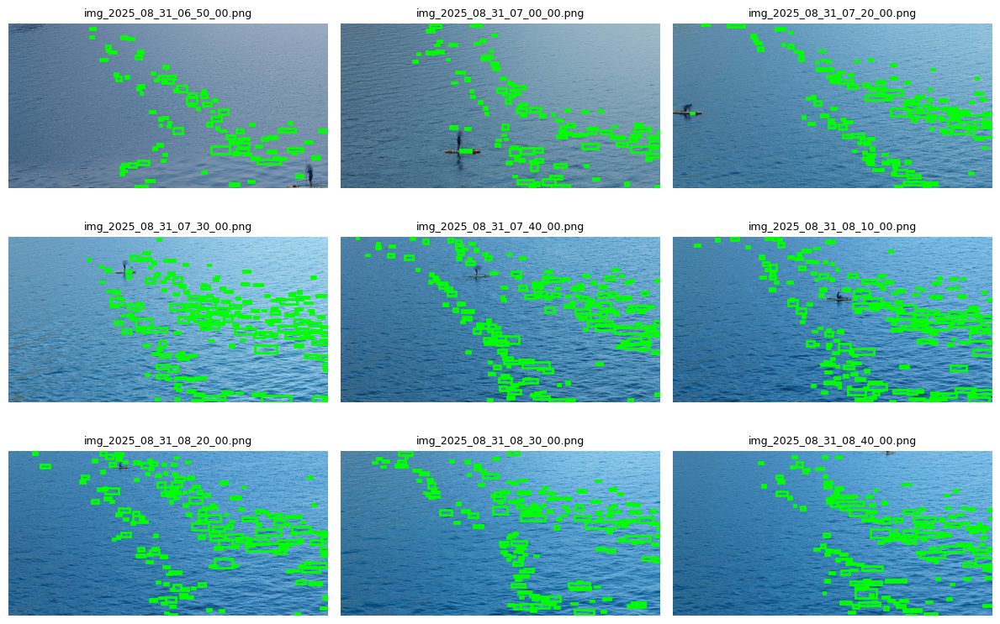

In [42]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Rectangle

# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Full-image ROI you already use (panorama coordinates)
x_min_full, x_max_full = 3837, 4767
y_min_full, y_max_full = 1555, 2035

# For cropping with cv2 (note: x = columns, y = rows)
crop_width  = x_max_full - x_min_full + 1
crop_height = y_max_full - y_min_full + 1

# Image paths
image_paths = [
    r"2025-08-31_experiment\img_2025_08_31_06_50_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_00_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_40_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_10_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_40_00.png",
]

# --- Linear ppm(y) model from your calibration ---
# ppm(y) = a_ppm * y + b_ppm, where y is FULL-IMAGE vertical pixel
# REPLACE these with your actual regression coefficients:
a_ppm = 0.05071  # example value, replace with your fitted slope
b_ppm = -65.01    # example intercept

def ppm_y(y_full):
    """Pixels per meter at full-image vertical coordinate y."""
    return a_ppm * y_full + b_ppm

# --- Wave detection parameters (from your YOLO-based script) ---
min_wave_area   = 15      # minimum contour area in px^2
max_wave_area    = 500   # NEW: reject very large blobs (tune!)
max_wave_height = 50      # maximum wave height in px
max_wave_width   = 100    # NEW: reject very wide boxes (tune!)
min_aspect_ratio = 1.2    # w / h must be >= this
max_aspect_ratio = 10.0   # NEW: reject *extremely* long boxes

# (Optional) blur & Canny parameters – can be tuned
blur_ksize = (5, 5)
canny_low  = 50
canny_high = 150

# ---------------------------------------------------------
# 2. MAIN WAVE DETECTION AND CONVERSION
# ---------------------------------------------------------

all_wave_rows = []
annot_data = {}  # for plotting later: cropped image and bounding boxes per image

for path in image_paths:
    fname = os.path.basename(path)

    # ---- 2.1 Load and crop ROI ----
    img = cv2.imread(path)
    if img is None:
        print(f"⚠️ Could not load image: {path}")
        continue

    # Crop [rows, cols] = [y_min:y_max+1, x_min:x_max+1]
    roi = img[y_min_full:y_max_full+1, x_min_full:x_max_full+1].copy()
    h_roi, w_roi = roi.shape[:2]

    # ---- 2.2 Preprocessing for contour detection (similar to your YOLO script) ----
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, blur_ksize, 0)

    # Otsu threshold
    _, binary = cv2.threshold(blurred, 0, 255,
                              cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Edge detection
    edges = cv2.Canny(binary, canny_low, canny_high)

    # Morphological cleaning
    kernel = np.ones((3, 3), np.uint8)
    edges_cleaned = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    # Contours
    contours, _ = cv2.findContours(edges_cleaned,
                                   cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_SIMPLE)

    # For annotation: keep bounding boxes
    bboxes = []

    wave_id = 0
    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w, h = cv2.boundingRect(cnt)
    
        if area < min_wave_area:
            continue
        if area > max_wave_area:
            continue  # too big -> probably merged structure or foam patch
        if h > max_wave_height:
            continue
        if w > max_wave_width:
            continue
    
        aspect_ratio = w / h if h > 0 else 0
        if aspect_ratio < min_aspect_ratio:
            continue
        if aspect_ratio > max_aspect_ratio:
            continue

        wave_id += 1

        # Height in pixels
        height_px = h

        # y position of middle of the box in *local ROI* coordinates (0 at top of ROI)
        y_mid_local = y + h / 2.0

        # Convert to FULL image coordinates (needed for ppm(y))
        y_mid_full = y_min_full + y_mid_local

        ppm_mid = ppm_y(y_mid_full)
        if ppm_mid <= 0:
            continue  # ignore bad scale

        height_m = height_px / ppm_mid

        # ---- Physical sanity filter (Lake Thun context) ----
        if height_m > 1:   # tune threshold if needed
            continue

        all_wave_rows.append(
            {
                "image": fname,
                "wave_id": wave_id,
                "bbox_x_local": x,
                "bbox_y_local": y,
                "bbox_w_px": w,
                "bbox_h_px": h,
                "y_mid_full_px": y_mid_full,
                "height_px": height_px,
                "ppm_at_y": ppm_mid,
                "height_m": height_m,
            }
        )

        # Save bbox for later visualisation
        bboxes.append((x, y, w, h))

    # Store ROI + bounding boxes for plotting
    annot_data[fname] = {
        "roi": roi,
        "bboxes": bboxes,
    }

# ---------------------------------------------------------
# 3. BUILD TABLE + SIGNIFICANT WAVE HEIGHT
# ---------------------------------------------------------

waves_df = pd.DataFrame(all_wave_rows)

if waves_df.empty:
    print("No waves detected with these parameters. Try relaxing filters (area, aspect ratio, etc.).")
else:
    waves_df = waves_df.sort_values(["image", "wave_id"]).reset_index(drop=True)
    display(waves_df)

    # Per-image summary (optional)
    summary = waves_df.groupby("image")["height_m"].agg(
        number_of_waves="count",
        mean_height_m="mean",
        max_height_m="max",
    )
    print("\nPer-image wave summary:")
    display(summary)

    # Significant wave height Hs (mean of highest 1/3 of waves)
    heights = waves_df["height_m"].dropna().values
    heights_sorted = np.sort(heights)[::-1]
    n = len(heights_sorted)
    n_top = max(1, n // 3)
    Hs = heights_sorted[:n_top].mean()

    print(f"\nTotal number of detected waves: {n}")
    print(f"Significant wave height Hs (mean of highest 1/3): {Hs:.3f} m")

# ---------------------------------------------------------
# 4. VISUALISATION OF CROPPED AREAS WITH WAVES HIGHLIGHTED
# ---------------------------------------------------------

fig, axes = plt.subplots(3, 3, figsize=(12, 8))
axes = axes.flatten()

for i, path in enumerate(image_paths):
    ax = axes[i]
    fname = os.path.basename(path)

    if fname not in annot_data:
        ax.axis("off")
        continue

    roi = annot_data[fname]["roi"]
    bboxes = annot_data[fname]["bboxes"]

    # Convert BGR (cv2) -> RGB (matplotlib)
    roi_rgb = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)

    ax.imshow(roi_rgb)
    ax.set_title(fname, fontsize=9)
    ax.axis("off")

    # Draw bounding boxes for each detected wave
    for (x, y, w, h) in bboxes:
        rect = Rectangle(
            (x, y),
            w,
            h,
            edgecolor="lime",
            facecolor="none",
            linewidth=2,
        )
        ax.add_patch(rect)

# Hide any leftover axes (if fewer than 9 images)
for j in range(len(image_paths), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [16]:
import matplotlib.pyplot as plt
import numpy as np
import os

# --- Make sure your data is ready ---
# Use filtered data (recommended)
heights_all = waves_df["height_m"].dropna().values
df = waves_df.copy()

# Ensure consistent image order
images = sorted(df["image"].unique())

# --- Helper: nice figure layout ---
def plot_wave_distributions(df, images, ncols=3):
    n_images = len(images)
    nrows = int(np.ceil(n_images / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    axes = axes.flatten()

    # For consistent y-axis scaling, find global range
    global_max = df["height_m"].max()
    bins = np.linspace(0, global_max, 20)

    for i, img in enumerate(images):
        ax = axes[i]
        subset = df[df["image"] == img]["height_m"].dropna()

        # Skip empty cases
        if subset.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            continue

        # Histogram
        ax.hist(subset, bins=bins, color="skyblue", edgecolor="black", alpha=0.8)
        ax.set_title(os.path.basename(img), fontsize=9)
        ax.set_xlim(0, global_max)
        ax.set_ylim(0, None)
        ax.grid(alpha=0.3, linestyle=":")
        if i % ncols == 0:
            ax.set_ylabel("Count")
        else:
            ax.set_yticklabels([])
        if i >= (nrows - 1) * ncols:
            ax.set_xlabel("Wave height (m)")
        else:
            ax.set_xticklabels([])

    # Turn off unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Wave height distribution per image (histograms)", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()


def plot_wave_boxplots(df, images, ncols=3):
    n_images = len(images)
    nrows = int(np.ceil(n_images / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    axes = axes.flatten()

    for i, img in enumerate(images):
        ax = axes[i]
        subset = df[df["image"] == img]["height_m"].dropna()

        if subset.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            continue

        ax.boxplot(subset, vert=True, patch_artist=True, showfliers=False,
                   boxprops=dict(facecolor="lightgreen", color="black"),
                   medianprops=dict(color="red", linewidth=1.5))
        ax.set_title(os.path.basename(img), fontsize=9)
        ax.set_ylim(0, df["height_m"].max() * 1.1)
        ax.grid(axis="y", alpha=0.3, linestyle=":")
        ax.set_xticklabels([])
        ax.set_ylabel("Wave height (m)")

    # Turn off unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Wave height boxplots per image", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()




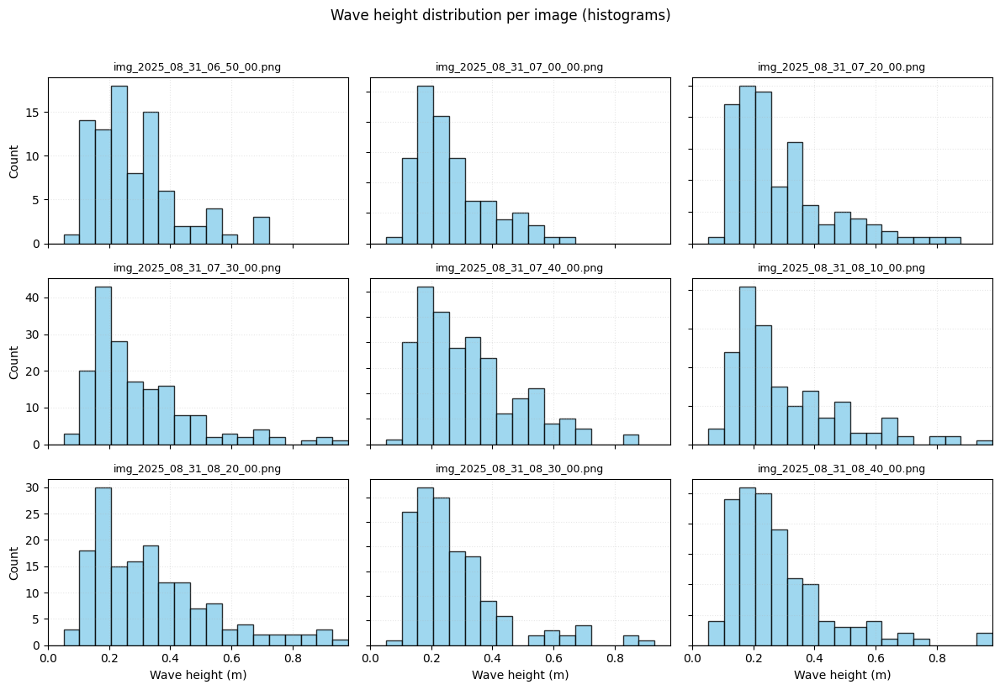

In [17]:
# --- Run both plots ---
plot_wave_distributions(df, images, ncols=3)

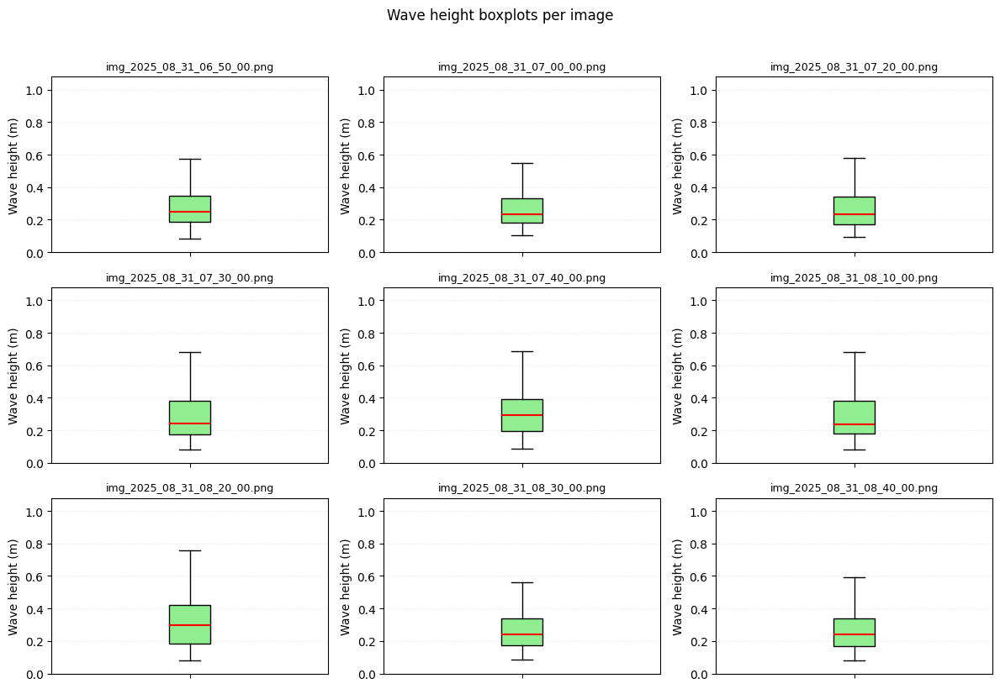

In [18]:
# --- Run both plots ---
plot_wave_boxplots(df, images, ncols=3)

                         image  number_of_waves  mean_height_m  max_height_m  \
0  img_2025_08_31_06_50_00.png             87.0       0.283275      0.705924   
1  img_2025_08_31_07_00_00.png            104.0       0.267569      0.632717   
2  img_2025_08_31_07_20_00.png            124.0       0.283535      0.867539   
3  img_2025_08_31_07_30_00.png            175.0       0.299097      0.937861   
4  img_2025_08_31_07_40_00.png            175.0       0.319576      0.827405   
5  img_2025_08_31_08_10_00.png            177.0       0.301366      0.981899   
6  img_2025_08_31_08_20_00.png            159.0       0.341412      0.955279   
7  img_2025_08_31_08_30_00.png            156.0       0.279613      0.884295   
8  img_2025_08_31_08_40_00.png            139.0       0.279873      0.960069   

       Hs_m                time  
0  0.439252 2025-08-31 06:50:00  
1  0.412268 2025-08-31 07:00:00  
2  0.462321 2025-08-31 07:20:00  
3  0.495436 2025-08-31 07:30:00  
4  0.503695 2025-08-31 07:40:

C:\Users\A\AppData\Local\Temp\ipykernel_27584\4256773379.py:31: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary = waves_df.groupby("image").apply(per_image_stats).reset_index()


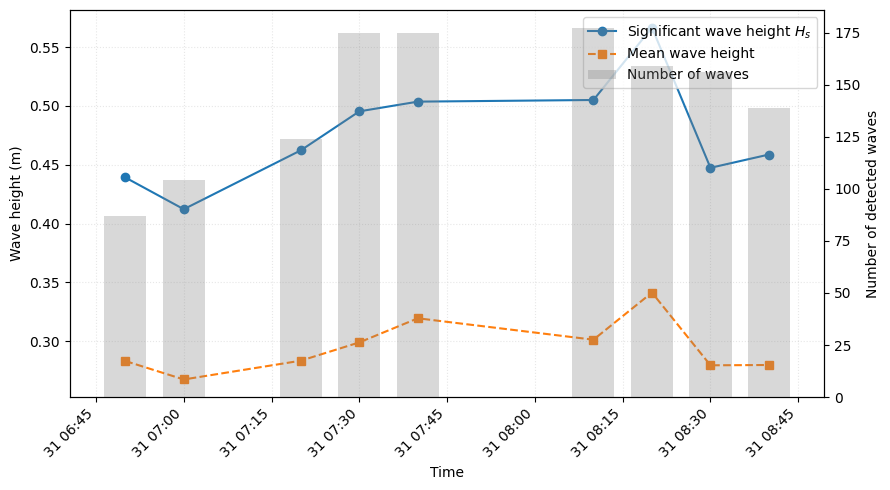

In [19]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------------
# 1. Per-image statistics (including per-image significant wave height)
# ------------------------------------------------------------------

def per_image_stats(group):
    """Return stats for one image group of waves_df."""
    heights = group["height_m"].dropna().values
    n = len(heights)
    if n == 0:
        return pd.Series({
            "number_of_waves": 0,
            "mean_height_m": np.nan,
            "max_height_m": np.nan,
            "Hs_m": np.nan
        })
    heights_sorted = np.sort(heights)[::-1]  # descending
    n_top = max(1, n // 3)                   # top 1/3
    Hs = heights_sorted[:n_top].mean()
    return pd.Series({
        "number_of_waves": n,
        "mean_height_m": heights.mean(),
        "max_height_m": heights.max(),
        "Hs_m": Hs
    })

summary = waves_df.groupby("image").apply(per_image_stats).reset_index()

# ------------------------------------------------------------------
# 2. Extract datetime from image filenames
#    e.g. "img_2025_08_31_06_50_00.png" -> 2025-08-31 06:50:00
# ------------------------------------------------------------------

def parse_time_from_name(name):
    base = os.path.basename(name)               # e.g. img_2025_08_31_06_50_00.png
    stem = os.path.splitext(base)[0]           # img_2025_08_31_06_50_00
    parts = stem.split("_")                    # ['img','2025','08','31','06','50','00']
    # take the last 6 parts: YYYY, MM, DD, HH, MM, SS
    y, m, d, H, M, S = map(int, parts[-6:])
    return pd.to_datetime(f"{y}-{m:02d}-{d:02d} {H:02d}:{M:02d}:{S:02d}")

summary["time"] = summary["image"].apply(parse_time_from_name)

# Sort by time to ensure correct order
summary = summary.sort_values("time").reset_index(drop=True)

print(summary)

# ------------------------------------------------------------------
# 3. Plot: Hs and mean height vs time + wave count on 2nd y-axis
# ------------------------------------------------------------------

fig, ax1 = plt.subplots(figsize=(9, 5))

# Lines for Hs and mean height
ax1.plot(summary["time"], summary["Hs_m"],
         marker="o", linestyle="-", label="Significant wave height $H_s$")
ax1.plot(summary["time"], summary["mean_height_m"],
         marker="s", linestyle="--", label="Mean wave height")

ax1.set_xlabel("Time")
ax1.set_ylabel("Wave height (m)")
ax1.grid(alpha=0.3, linestyle=":")
ax1.legend(loc="upper left")

# Rotate x labels for readability
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right")

# Secondary axis: number of detected waves as bars
ax2 = ax1.twinx()
ax2.bar(summary["time"], summary["number_of_waves"],
        width=0.005, alpha=0.3, color="gray", label="Number of waves")

ax2.set_ylabel("Number of detected waves")

# Optional: add legend entry for bars
# (need to combine handles from both axes)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")

plt.tight_layout()
plt.show()

# Detection with YOLO Model

Code version first crop and than only detect the waves in the detected area. 


0: 512x992 6969 waves, 33.1ms
Speed: 4.7ms preprocess, 33.1ms inference, 8.5ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 8041 waves, 28.2ms
Speed: 3.9ms preprocess, 28.2ms inference, 7.4ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 8769 waves, 28.2ms
Speed: 3.7ms preprocess, 28.2ms inference, 9.6ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 8189 waves, 165.8ms
Speed: 6.8ms preprocess, 165.8ms inference, 20.0ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 8109 waves, 29.1ms
Speed: 3.9ms preprocess, 29.1ms inference, 7.9ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 8673 waves, 29.1ms
Speed: 3.9ms preprocess, 29.1ms inference, 9.9ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 8945 waves, 164.3ms
Speed: 6.5ms preprocess, 164.3ms inference, 19.1ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 9230 waves, 28.6ms
Speed: 4.2ms preprocess, 28.6ms inference, 10.9ms postprocess per i

,image,wave_id,x1_crop_px,y1_crop_px,x2_crop_px,y2_crop_px,y_mid_full_px,height_px,ppm_at_y,height_m
0,img_2025_08_31_06_50_00.png,1,178,47,190,50,1603.5,3,16.310530,0.183930
1,img_2025_08_31_06_50_00.png,2,81,159,91,162,1715.5,3,21.990502,0.136423
2,img_2025_08_31_06_50_00.png,3,222,107,234,110,1663.5,3,19.353372,0.155012
3,img_2025_08_31_06_50_00.png,4,192,62,206,65,1618.5,3,17.071241,0.175734
4,img_2025_08_31_06_50_00.png,5,533,107,542,110,1663.5,3,19.353372,0.155012
...,...,...,...,...,...,...,...,...,...,...
76086,img_2025_08_31_08_40_00.png,9162,48,66,59,69,1622.5,3,17.274097,0.173670
76087,img_2025_08_31_08_40_00.png,9163,911,76,930,81,1633.5,5,17.831951,0.280396
76088,img_2025_08_31_08_40_00.png,9164,864,392,891,396,1949.0,4,33.832228,0.118230
76089,img_2025_08_31_08_40_00.png,9165,886,65,904,69,1622.0,4,17.248740,0.231901



Per-image wave summary:


,number_of_waves,mean_height_m,max_height_m
image,,,
img_2025_08_31_06_50_00.png,6969,0.132587,0.285652
img_2025_08_31_07_00_00.png,8041,0.124487,0.286691
img_2025_08_31_07_20_00.png,8769,0.131402,0.339250
img_2025_08_31_07_30_00.png,8189,0.136831,0.361675
img_2025_08_31_07_40_00.png,8109,0.136352,0.339250
img_2025_08_31_08_10_00.png,8673,0.136805,0.348853
img_2025_08_31_08_20_00.png,8945,0.134526,0.348853
img_2025_08_31_08_30_00.png,9230,0.137335,0.376644
img_2025_08_31_08_40_00.png,9166,0.132819,0.402866



Total number of detected waves in ROI: 76091
Significant wave height Hs (mean of highest 1/3): 0.185 m


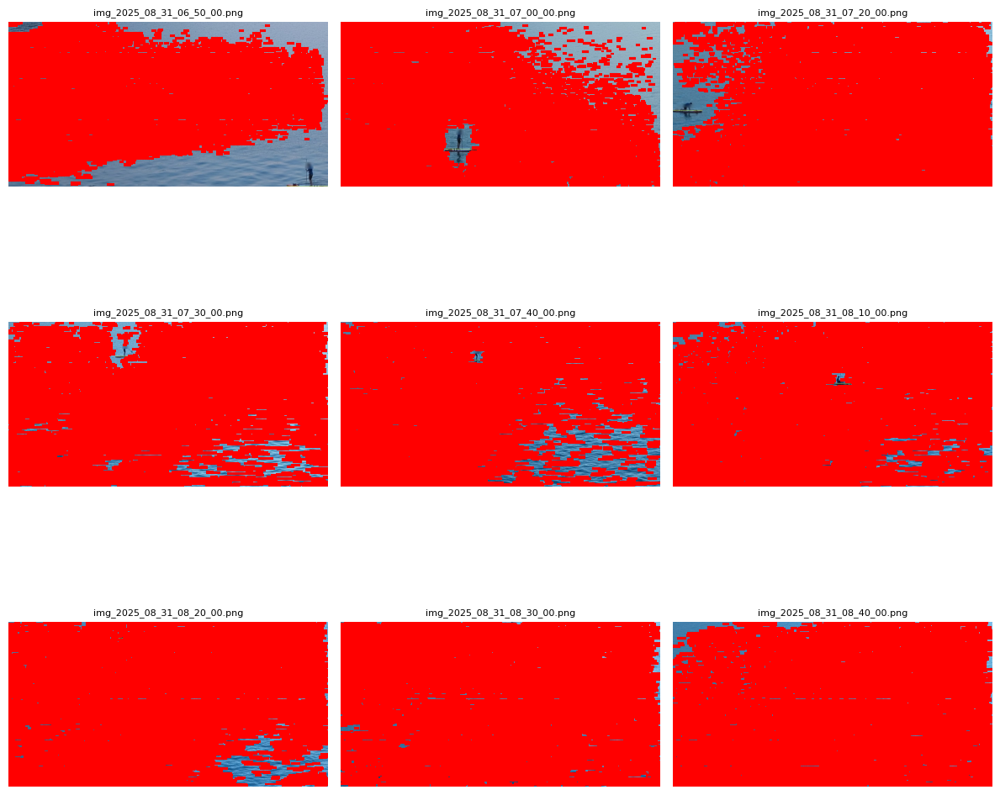

In [17]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Full-image ROI (pixels)
x_min, x_max = 3837, 4767
y_min, y_max = 1555, 2035
crop_box = (x_min, y_min, x_max + 1, y_max + 1)  # (left, top, right, bottom)

# Image paths (9 images)
image_paths = [
    r"2025-08-31_experiment\img_2025_08_31_06_50_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_00_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_40_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_10_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_40_00.png",
]

# ---- Linear ppm model from your SUP-board calibration ----
# Assume `a` and `b` are defined in another cell as regression slope & intercept.

def _init_ppm_coeffs():
    """Safely initialize a_ppm and b_ppm from regression a, b."""
    global a_ppm, b_ppm

    # If they already exist and look like floats, don't touch them
    if "a_ppm" in globals() and "b_ppm" in globals():
        if isinstance(a_ppm, (int, float)) and isinstance(b_ppm, (int, float)):
            return

    # Otherwise, take from a, b and force to float
    a_ppm_local = float(a)
    b_ppm_local = float(b)
    a_ppm = a_ppm_local
    b_ppm = b_ppm_local


# Initialize ppm coefficients safely
_init_ppm_coeffs()

def ppm_y(y_full):
    """Pixels-per-meter at full-image vertical coordinate y."""
    return a_ppm * y_full + b_ppm


# ---------------------------------------------------------
# 2. YOLO WAVE-DETECTION CONFIG
# ---------------------------------------------------------

YOLO_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
#YOLO_MODEL_PATH = r"02_waves_yolov8n-1000_150e.pt"
#YOLO_MODEL_PATH = r"02_waves_yolov8n-1000_50e.pt"

device = "cuda"      # or "cpu"
wave_class_id = 0    # adjust if your model has multiple classes

yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det=10000

model = YOLO(YOLO_MODEL_PATH)


# ---------------------------------------------------------
# 3. MAIN LOOP: crop → YOLO on crop → height in meters
# ---------------------------------------------------------

all_wave_rows = []
detections_for_plot = {}  # fname -> list of (x1, y1, x2, y2) in CROP coordinates
cropped_cache = {}        # fname -> cropped PIL image (for plotting later)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        full_img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    # 3.1 crop the ROI first
    cropped = full_img.crop(crop_box)  # coordinates relative to full image
    cropped_cache[fname] = cropped
    detections_for_plot[fname] = []

    # Convert cropped to numpy array for YOLO
    cropped_np = np.array(cropped)

    # 3.2 run YOLO on the cropped image
    try:
        results = model(cropped_np, device=device, conf=yolo_conf,
                        iou=yolo_iou, imgsz=yolo_imgsz,max_det=max_det)
    except Exception as e:
        print(f"⚠️ YOLO inference failed for {path}: {e}")
        continue

    if len(results) == 0:
        continue

    r = results[0]
    boxes = r.boxes
    if boxes is None or len(boxes) == 0:
        continue

    wave_id = 0

    # IMPORTANT: don't reuse `b` here, use `box`
    for box in boxes:
        cls = int(box.cls)
        if cls != wave_class_id:
            continue

        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # crop coords
        if x2 <= x1 or y2 <= y1:
            continue

        wave_id += 1
        height_px = y2 - y1

        # vertical midpoint in CROP coordinates
        y_mid_local = 0.5 * (y1 + y2)
        # convert to full-image y (add crop offset)
        y_mid_full = y_min + y_mid_local

        ppm_mid = ppm_y(y_mid_full)
        if ppm_mid <= 0:
            continue

        height_m = height_px / ppm_mid

        detections_for_plot[fname].append((x1, y1, x2, y2))

        all_wave_rows.append(
            {
                "image": fname,
                "wave_id": wave_id,
                "x1_crop_px": x1,
                "y1_crop_px": y1,
                "x2_crop_px": x2,
                "y2_crop_px": y2,
                "y_mid_full_px": y_mid_full,
                "height_px": height_px,
                "ppm_at_y": ppm_mid,
                "height_m": height_m,
            }
        )


# ---------------------------------------------------------
# 4. Build table + significant wave height
# ---------------------------------------------------------

waves_df = pd.DataFrame(all_wave_rows)

if waves_df.empty:
    print("No waves detected by YOLO in the cropped ROI.")
else:
    waves_df = waves_df.sort_values(["image", "wave_id"]).reset_index(drop=True)
    display(waves_df)

    summary = waves_df.groupby("image")["height_m"].agg(
        number_of_waves="count",
        mean_height_m="mean",
        max_height_m="max",
    )
    print("\nPer-image wave summary:")
    display(summary)

    heights = waves_df["height_m"].dropna().values
    heights_sorted = np.sort(heights)[::-1]
    n = len(heights_sorted)
    n_top = max(1, n // 3)
    Hs = heights_sorted[:n_top].mean()
    print(f"\nTotal number of detected waves in ROI: {n}")
    print(f"Significant wave height Hs (mean of highest 1/3): {Hs:.3f} m")


# ---------------------------------------------------------
# 5. Plot: 3×3 grid of cropped images + red YOLO boxes
# ---------------------------------------------------------

n_imgs = len(image_paths)
ncols = 3
nrows = int(np.ceil(n_imgs / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 12))
axes = np.atleast_2d(axes)

for idx, path in enumerate(image_paths):
    fname = os.path.basename(path)
    row = idx // ncols
    col = idx % ncols
    ax = axes[row, col]

    if fname not in cropped_cache:
        ax.axis("off")
        continue

    cropped = cropped_cache[fname]
    ax.imshow(cropped)
    ax.set_title(fname, fontsize=8)
    ax.axis("off")

    # draw red rectangles for each detected wave (crop coords)
    for (x1, y1, x2, y2) in detections_for_plot.get(fname, []):
        w = x2 - x1
        h = y2 - y1
        rect = plt.Rectangle(
            (x1, y1),
            w,
            h,
            edgecolor="red",
            facecolor="none",
            linewidth=1.5,
        )
        ax.add_patch(rect)

# hide any unused subplots
for k in range(idx + 1, nrows * ncols):
    row = k // ncols
    col = k % ncols
    axes[row, col].axis("off")

plt.tight_layout()
plt.savefig("YOLO_yolov8s-1000_150e_wave_detections_cropped_3x3.jpg", dpi=300)
plt.show()


0: 512x992 5019 waves, 108.8ms
Speed: 14.6ms preprocess, 108.8ms inference, 20.9ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 3156 waves, 20.9ms
Speed: 10.2ms preprocess, 20.9ms inference, 91.4ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 3144 waves, 74.4ms
Speed: 14.2ms preprocess, 74.4ms inference, 10.6ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 1924 waves, 200.8ms
Speed: 16.7ms preprocess, 200.8ms inference, 9.4ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 664 waves, 16.5ms
Speed: 11.5ms preprocess, 16.5ms inference, 5.7ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 2153 waves, 19.9ms
Speed: 11.8ms preprocess, 19.9ms inference, 4.7ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 1006 waves, 73.8ms
Speed: 10.9ms preprocess, 73.8ms inference, 5.5ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 2109 waves, 73.3ms
Speed: 17.4ms preprocess, 73.3ms inference, 7.4ms postproces

,image,wave_id,x1_crop_px,y1_crop_px,x2_crop_px,y2_crop_px,y_mid_full_px,height_px,ppm_at_y,height_m
0,img_2025_08_31_06_50_00.png,1,374,475,386,478,2031.5,3,38.016136,0.078914
1,img_2025_08_31_06_50_00.png,2,291,475,301,478,2031.5,3,38.016136,0.078914
2,img_2025_08_31_06_50_00.png,3,123,469,143,471,2025.0,2,37.686495,0.053069
3,img_2025_08_31_06_50_00.png,4,204,453,214,455,2009.0,2,36.875070,0.054237
4,img_2025_08_31_06_50_00.png,5,126,468,144,471,2024.5,3,37.661138,0.079658
...,...,...,...,...,...,...,...,...,...,...
22257,img_2025_08_31_08_40_00.png,3083,115,265,127,268,1821.5,3,27.366189,0.109624
22258,img_2025_08_31_08_40_00.png,3084,462,152,474,155,1708.5,3,21.635503,0.138661
22259,img_2025_08_31_08_40_00.png,3085,180,396,197,399,1952.5,3,34.009727,0.088210
22260,img_2025_08_31_08_40_00.png,3086,164,412,181,414,1968.0,2,34.795795,0.057478



Per-image wave summary:


,number_of_waves,mean_height_m,max_height_m
image,,,
img_2025_08_31_06_50_00.png,5019,0.137349,0.281573
img_2025_08_31_07_00_00.png,3156,0.129345,0.273755
img_2025_08_31_07_20_00.png,3144,0.157063,0.281573
img_2025_08_31_07_30_00.png,1924,0.176367,0.281573
img_2025_08_31_07_40_00.png,664,0.166638,0.281573
img_2025_08_31_08_10_00.png,2153,0.142353,0.281573
img_2025_08_31_08_20_00.png,1006,0.133264,0.281573
img_2025_08_31_08_30_00.png,2109,0.102648,0.270934
img_2025_08_31_08_40_00.png,3087,0.137099,0.281573



Total number of detected waves in ROI: 22262
Significant wave height Hs (mean of highest 1/3): 0.198 m


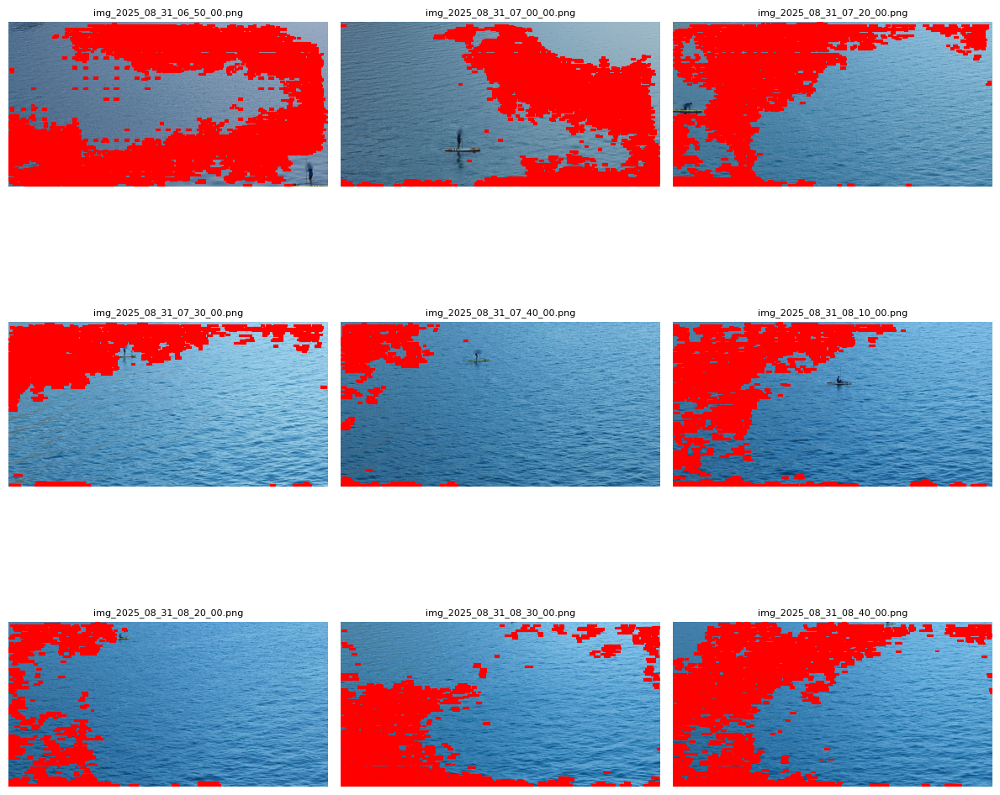

In [23]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Full-image ROI (pixels)
x_min, x_max = 3837, 4767
y_min, y_max = 1555, 2035
crop_box = (x_min, y_min, x_max + 1, y_max + 1)  # (left, top, right, bottom)

# Image paths (9 images)
image_paths = [
    r"2025-08-31_experiment\img_2025_08_31_06_50_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_00_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_40_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_10_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_40_00.png",
]

# ---- Linear ppm model from your SUP-board calibration ----
# Assume `a` and `b` are defined in another cell as regression slope & intercept.

def _init_ppm_coeffs():
    """Safely initialize a_ppm and b_ppm from regression a, b."""
    global a_ppm, b_ppm

    # If they already exist and look like floats, don't touch them
    if "a_ppm" in globals() and "b_ppm" in globals():
        if isinstance(a_ppm, (int, float)) and isinstance(b_ppm, (int, float)):
            return

    # Otherwise, take from a, b and force to float
    a_ppm_local = float(a)
    b_ppm_local = float(b)
    a_ppm = a_ppm_local
    b_ppm = b_ppm_local


# Initialize ppm coefficients safely
_init_ppm_coeffs()

def ppm_y(y_full):
    """Pixels-per-meter at full-image vertical coordinate y."""
    return a_ppm * y_full + b_ppm


# ---------------------------------------------------------
# 2. YOLO WAVE-DETECTION CONFIG
# ---------------------------------------------------------

#YOLO_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
YOLO_MODEL_PATH = r"02_waves_yolov8n-1000_150e.pt"
#YOLO_MODEL_PATH = r"02_waves_yolov8n-1000_50e.pt"

device = "cuda"      # or "cpu"
wave_class_id = 0    # adjust if your model has multiple classes

yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det=10000

model = YOLO(YOLO_MODEL_PATH)


# ---------------------------------------------------------
# 3. MAIN LOOP: crop → YOLO on crop → height in meters
# ---------------------------------------------------------

all_wave_rows = []
detections_for_plot = {}  # fname -> list of (x1, y1, x2, y2) in CROP coordinates
cropped_cache = {}        # fname -> cropped PIL image (for plotting later)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        full_img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    # 3.1 crop the ROI first
    cropped = full_img.crop(crop_box)  # coordinates relative to full image
    cropped_cache[fname] = cropped
    detections_for_plot[fname] = []

    # Convert cropped to numpy array for YOLO
    cropped_np = np.array(cropped)

    # 3.2 run YOLO on the cropped image
    try:
        results = model(cropped_np, device=device, conf=yolo_conf,
                        iou=yolo_iou, imgsz=yolo_imgsz,max_det=max_det)
    except Exception as e:
        print(f"⚠️ YOLO inference failed for {path}: {e}")
        continue

    if len(results) == 0:
        continue

    r = results[0]
    boxes = r.boxes
    if boxes is None or len(boxes) == 0:
        continue

    wave_id = 0

    # IMPORTANT: don't reuse `b` here, use `box`
    for box in boxes:
        cls = int(box.cls)
        if cls != wave_class_id:
            continue

        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # crop coords
        if x2 <= x1 or y2 <= y1:
            continue

        wave_id += 1
        height_px = y2 - y1

        # vertical midpoint in CROP coordinates
        y_mid_local = 0.5 * (y1 + y2)
        # convert to full-image y (add crop offset)
        y_mid_full = y_min + y_mid_local

        ppm_mid = ppm_y(y_mid_full)
        if ppm_mid <= 0:
            continue

        height_m = height_px / ppm_mid

        detections_for_plot[fname].append((x1, y1, x2, y2))

        all_wave_rows.append(
            {
                "image": fname,
                "wave_id": wave_id,
                "x1_crop_px": x1,
                "y1_crop_px": y1,
                "x2_crop_px": x2,
                "y2_crop_px": y2,
                "y_mid_full_px": y_mid_full,
                "height_px": height_px,
                "ppm_at_y": ppm_mid,
                "height_m": height_m,
            }
        )


# ---------------------------------------------------------
# 4. Build table + significant wave height
# ---------------------------------------------------------

waves_df = pd.DataFrame(all_wave_rows)

if waves_df.empty:
    print("No waves detected by YOLO in the cropped ROI.")
else:
    waves_df = waves_df.sort_values(["image", "wave_id"]).reset_index(drop=True)
    display(waves_df)

    summary = waves_df.groupby("image")["height_m"].agg(
        number_of_waves="count",
        mean_height_m="mean",
        max_height_m="max",
    )
    print("\nPer-image wave summary:")
    display(summary)

    heights = waves_df["height_m"].dropna().values
    heights_sorted = np.sort(heights)[::-1]
    n = len(heights_sorted)
    n_top = max(1, n // 3)
    Hs = heights_sorted[:n_top].mean()
    print(f"\nTotal number of detected waves in ROI: {n}")
    print(f"Significant wave height Hs (mean of highest 1/3): {Hs:.3f} m")


# ---------------------------------------------------------
# 5. Plot: 3×3 grid of cropped images + red YOLO boxes
# ---------------------------------------------------------

n_imgs = len(image_paths)
ncols = 3
nrows = int(np.ceil(n_imgs / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 12))
axes = np.atleast_2d(axes)

for idx, path in enumerate(image_paths):
    fname = os.path.basename(path)
    row = idx // ncols
    col = idx % ncols
    ax = axes[row, col]

    if fname not in cropped_cache:
        ax.axis("off")
        continue

    cropped = cropped_cache[fname]
    ax.imshow(cropped)
    ax.set_title(fname, fontsize=8)
    ax.axis("off")

    # draw red rectangles for each detected wave (crop coords)
    for (x1, y1, x2, y2) in detections_for_plot.get(fname, []):
        w = x2 - x1
        h = y2 - y1
        rect = plt.Rectangle(
            (x1, y1),
            w,
            h,
            edgecolor="red",
            facecolor="none",
            linewidth=1.5,
        )
        ax.add_patch(rect)

# hide any unused subplots
for k in range(idx + 1, nrows * ncols):
    row = k // ncols
    col = k % ncols
    axes[row, col].axis("off")

plt.tight_layout()
plt.savefig("YOLO_yolov8n-1000_150e_wave_detections_cropped_3x3.jpg", dpi=300)
plt.show()

In [105]:
print(type(a_ppm), a_ppm)
print(type(b_ppm), b_ppm)

<class 'numpy.float64'> 0.050714032284566064
<class 'numpy.float64'> -65.00942069838142



0: 512x992 5142 waves, 15.5ms
Speed: 7.6ms preprocess, 15.5ms inference, 7.6ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 3510 waves, 14.8ms
Speed: 7.7ms preprocess, 14.8ms inference, 5.1ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 250 waves, 74.6ms
Speed: 31.7ms preprocess, 74.6ms inference, 3.8ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 646 waves, 140.1ms
Speed: 11.0ms preprocess, 140.1ms inference, 4.9ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 124 waves, 155.3ms
Speed: 15.9ms preprocess, 155.3ms inference, 3.4ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 72 waves, 21.5ms
Speed: 8.6ms preprocess, 21.5ms inference, 3.7ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 57 waves, 21.4ms
Speed: 9.0ms preprocess, 21.4ms inference, 3.6ms postprocess per image at shape (1, 3, 512, 992)

0: 512x992 41 waves, 21.4ms
Speed: 9.1ms preprocess, 21.4ms inference, 4.0ms postprocess per image at s

,image,wave_id,x1_crop_px,y1_crop_px,x2_crop_px,y2_crop_px,y_mid_full_px,height_px,ppm_at_y,height_m
0,img_2025_08_31_06_50_00.png,1,126,468,144,471,2024.5,3,37.661138,0.079658
1,img_2025_08_31_06_50_00.png,2,757,133,775,136,1689.5,3,20.671937,0.145124
2,img_2025_08_31_06_50_00.png,3,724,137,738,140,1693.5,3,20.874793,0.143714
3,img_2025_08_31_06_50_00.png,4,125,468,144,470,2024.0,2,37.635781,0.053141
4,img_2025_08_31_06_50_00.png,5,756,107,769,110,1663.5,3,19.353372,0.155012
...,...,...,...,...,...,...,...,...,...,...
9868,img_2025_08_31_08_40_00.png,27,923,190,931,193,1746.5,3,23.562637,0.127320
9869,img_2025_08_31_08_40_00.png,28,336,475,350,478,2031.5,3,38.016136,0.078914
9870,img_2025_08_31_08_40_00.png,29,855,17,876,20,1573.5,3,14.789109,0.202852
9871,img_2025_08_31_08_40_00.png,30,808,475,826,478,2031.5,3,38.016136,0.078914



Per-image wave summary:


,number_of_waves,mean_height_m,max_height_m
image,,,
img_2025_08_31_06_50_00.png,5142,0.137318,0.281573
img_2025_08_31_07_00_00.png,3510,0.128966,0.281573
img_2025_08_31_07_20_00.png,250,0.158207,0.251096
img_2025_08_31_07_30_00.png,646,0.157196,0.281573
img_2025_08_31_07_40_00.png,124,0.088365,0.263688
img_2025_08_31_08_10_00.png,72,0.095075,0.208574
img_2025_08_31_08_20_00.png,57,0.088166,0.167063
img_2025_08_31_08_30_00.png,41,0.120656,0.200107
img_2025_08_31_08_40_00.png,31,0.115111,0.213852



Total number of detected waves in ROI: 9873
Significant wave height Hs (mean of highest 1/3): 0.178 m


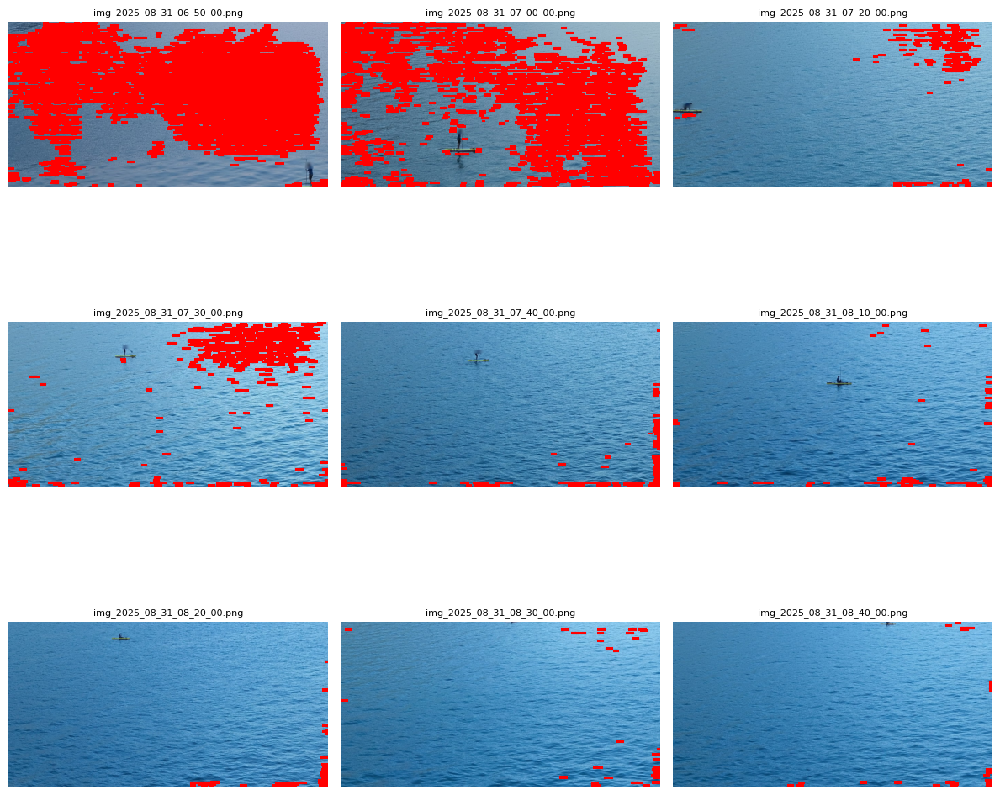

In [24]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Full-image ROI (pixels)
x_min, x_max = 3837, 4767
y_min, y_max = 1555, 2035
crop_box = (x_min, y_min, x_max + 1, y_max + 1)  # (left, top, right, bottom)

# Image paths (9 images)
image_paths = [
    r"2025-08-31_experiment\img_2025_08_31_06_50_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_00_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_07_40_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_10_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_20_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_30_00.png",
    r"2025-08-31_experiment\img_2025_08_31_08_40_00.png",
]

# ---- Linear ppm model from your SUP-board calibration ----
# Assume `a` and `b` are defined in another cell as regression slope & intercept.

def _init_ppm_coeffs():
    """Safely initialize a_ppm and b_ppm from regression a, b."""
    global a_ppm, b_ppm

    # If they already exist and look like floats, don't touch them
    if "a_ppm" in globals() and "b_ppm" in globals():
        if isinstance(a_ppm, (int, float)) and isinstance(b_ppm, (int, float)):
            return

    # Otherwise, take from a, b and force to float
    a_ppm_local = float(a)
    b_ppm_local = float(b)
    a_ppm = a_ppm_local
    b_ppm = b_ppm_local


# Initialize ppm coefficients safely
_init_ppm_coeffs()

def ppm_y(y_full):
    """Pixels-per-meter at full-image vertical coordinate y."""
    return a_ppm * y_full + b_ppm


# ---------------------------------------------------------
# 2. YOLO WAVE-DETECTION CONFIG
# ---------------------------------------------------------

#YOLO_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
#YOLO_MODEL_PATH = r"02_waves_yolov8n-1000_150e.pt"
YOLO_MODEL_PATH = r"02_waves_yolov8n-1000_50e.pt"

device = "cuda"      # or "cpu"
wave_class_id = 0    # adjust if your model has multiple classes

yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det=10000

model = YOLO(YOLO_MODEL_PATH)


# ---------------------------------------------------------
# 3. MAIN LOOP: crop → YOLO on crop → height in meters
# ---------------------------------------------------------

all_wave_rows = []
detections_for_plot = {}  # fname -> list of (x1, y1, x2, y2) in CROP coordinates
cropped_cache = {}        # fname -> cropped PIL image (for plotting later)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        full_img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    # 3.1 crop the ROI first
    cropped = full_img.crop(crop_box)  # coordinates relative to full image
    cropped_cache[fname] = cropped
    detections_for_plot[fname] = []

    # Convert cropped to numpy array for YOLO
    cropped_np = np.array(cropped)

    # 3.2 run YOLO on the cropped image
    try:
        results = model(cropped_np, device=device, conf=yolo_conf,
                        iou=yolo_iou, imgsz=yolo_imgsz,max_det=max_det)
    except Exception as e:
        print(f"⚠️ YOLO inference failed for {path}: {e}")
        continue

    if len(results) == 0:
        continue

    r = results[0]
    boxes = r.boxes
    if boxes is None or len(boxes) == 0:
        continue

    wave_id = 0

    # IMPORTANT: don't reuse `b` here, use `box`
    for box in boxes:
        cls = int(box.cls)
        if cls != wave_class_id:
            continue

        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # crop coords
        if x2 <= x1 or y2 <= y1:
            continue

        wave_id += 1
        height_px = y2 - y1

        # vertical midpoint in CROP coordinates
        y_mid_local = 0.5 * (y1 + y2)
        # convert to full-image y (add crop offset)
        y_mid_full = y_min + y_mid_local

        ppm_mid = ppm_y(y_mid_full)
        if ppm_mid <= 0:
            continue

        height_m = height_px / ppm_mid

        detections_for_plot[fname].append((x1, y1, x2, y2))

        all_wave_rows.append(
            {
                "image": fname,
                "wave_id": wave_id,
                "x1_crop_px": x1,
                "y1_crop_px": y1,
                "x2_crop_px": x2,
                "y2_crop_px": y2,
                "y_mid_full_px": y_mid_full,
                "height_px": height_px,
                "ppm_at_y": ppm_mid,
                "height_m": height_m,
            }
        )


# ---------------------------------------------------------
# 4. Build table + significant wave height
# ---------------------------------------------------------

waves_df = pd.DataFrame(all_wave_rows)

if waves_df.empty:
    print("No waves detected by YOLO in the cropped ROI.")
else:
    waves_df = waves_df.sort_values(["image", "wave_id"]).reset_index(drop=True)
    display(waves_df)

    summary = waves_df.groupby("image")["height_m"].agg(
        number_of_waves="count",
        mean_height_m="mean",
        max_height_m="max",
    )
    print("\nPer-image wave summary:")
    display(summary)

    heights = waves_df["height_m"].dropna().values
    heights_sorted = np.sort(heights)[::-1]
    n = len(heights_sorted)
    n_top = max(1, n // 3)
    Hs = heights_sorted[:n_top].mean()
    print(f"\nTotal number of detected waves in ROI: {n}")
    print(f"Significant wave height Hs (mean of highest 1/3): {Hs:.3f} m")


# ---------------------------------------------------------
# 5. Plot: 3×3 grid of cropped images + red YOLO boxes
# ---------------------------------------------------------

n_imgs = len(image_paths)
ncols = 3
nrows = int(np.ceil(n_imgs / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 12))
axes = np.atleast_2d(axes)

for idx, path in enumerate(image_paths):
    fname = os.path.basename(path)
    row = idx // ncols
    col = idx % ncols
    ax = axes[row, col]

    if fname not in cropped_cache:
        ax.axis("off")
        continue

    cropped = cropped_cache[fname]
    ax.imshow(cropped)
    ax.set_title(fname, fontsize=8)
    ax.axis("off")

    # draw red rectangles for each detected wave (crop coords)
    for (x1, y1, x2, y2) in detections_for_plot.get(fname, []):
        w = x2 - x1
        h = y2 - y1
        rect = plt.Rectangle(
            (x1, y1),
            w,
            h,
            edgecolor="red",
            facecolor="none",
            linewidth=1.5,
        )
        ax.add_patch(rect)

# hide any unused subplots
for k in range(idx + 1, nrows * ncols):
    row = k // ncols
    col = k % ncols
    axes[row, col].axis("off")

plt.tight_layout()
plt.savefig("YOLO_yolov8n-1000_50e_wave_detections_cropped_3x3.jpg", dpi=300)
plt.show()

In [103]:
print(type(a_ppm), a_ppm)
print(type(b_ppm), b_ppm)

<class 'numpy.float64'> 0.050714032284566064
<class 'numpy.float64'> -65.00942069838142


C:\Users\A\AppData\Local\Temp\ipykernel_25588\656819981.py:31: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  summary = waves_df.groupby("image").apply(per_image_stats).reset_index()


                         image  number_of_waves  mean_height_m  max_height_m  \
0  img_2025_08_31_06_50_00.png           6969.0       0.132587      0.285652   
1  img_2025_08_31_07_00_00.png           8041.0       0.124487      0.286691   
2  img_2025_08_31_07_20_00.png           8769.0       0.131402      0.339250   
3  img_2025_08_31_07_30_00.png           8189.0       0.136831      0.361675   
4  img_2025_08_31_07_40_00.png           8109.0       0.136352      0.339250   
5  img_2025_08_31_08_10_00.png           8673.0       0.136805      0.348853   
6  img_2025_08_31_08_20_00.png           8945.0       0.134526      0.348853   
7  img_2025_08_31_08_30_00.png           9230.0       0.137335      0.376644   
8  img_2025_08_31_08_40_00.png           9166.0       0.132819      0.402866   

       Hs_m                time  
0  0.171787 2025-08-31 06:50:00  
1  0.170156 2025-08-31 07:00:00  
2  0.184538 2025-08-31 07:20:00  
3  0.188609 2025-08-31 07:30:00  
4  0.190333 2025-08-31 07:40:

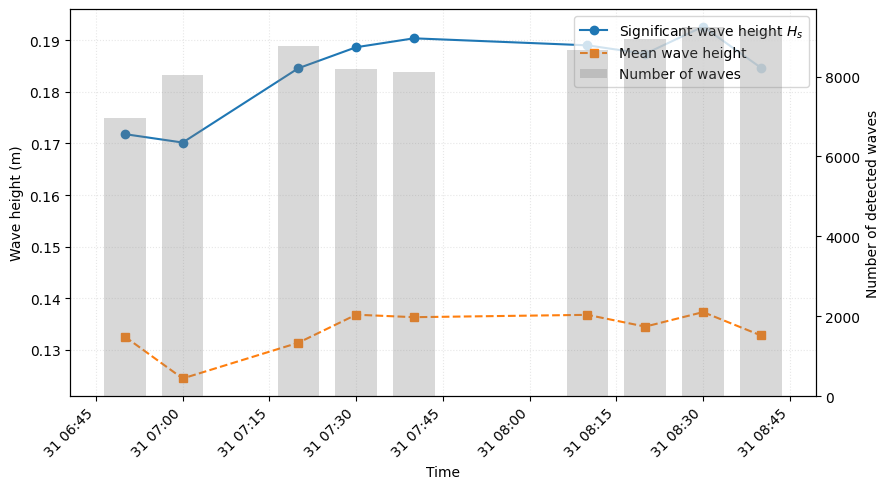

In [22]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------------
# 1. Per-image statistics (including per-image significant wave height)
# ------------------------------------------------------------------

def per_image_stats(group):
    """Return stats for one image group of waves_df."""
    heights = group["height_m"].dropna().values
    n = len(heights)
    if n == 0:
        return pd.Series({
            "number_of_waves": 0,
            "mean_height_m": np.nan,
            "max_height_m": np.nan,
            "Hs_m": np.nan
        })
    heights_sorted = np.sort(heights)[::-1]  # descending
    n_top = max(1, n // 3)                   # top 1/3
    Hs = heights_sorted[:n_top].mean()
    return pd.Series({
        "number_of_waves": n,
        "mean_height_m": heights.mean(),
        "max_height_m": heights.max(),
        "Hs_m": Hs
    })

summary = waves_df.groupby("image").apply(per_image_stats).reset_index()

# ------------------------------------------------------------------
# 2. Extract datetime from image filenames
#    e.g. "img_2025_08_31_06_50_00.png" -> 2025-08-31 06:50:00
# ------------------------------------------------------------------

def parse_time_from_name(name):
    base = os.path.basename(name)               # e.g. img_2025_08_31_06_50_00.png
    stem = os.path.splitext(base)[0]           # img_2025_08_31_06_50_00
    parts = stem.split("_")                    # ['img','2025','08','31','06','50','00']
    # take the last 6 parts: YYYY, MM, DD, HH, MM, SS
    y, m, d, H, M, S = map(int, parts[-6:])
    return pd.to_datetime(f"{y}-{m:02d}-{d:02d} {H:02d}:{M:02d}:{S:02d}")

summary["time"] = summary["image"].apply(parse_time_from_name)

# Sort by time to ensure correct order
summary = summary.sort_values("time").reset_index(drop=True)

print(summary)

# ------------------------------------------------------------------
# 3. Plot: Hs and mean height vs time + wave count on 2nd y-axis
# ------------------------------------------------------------------

fig, ax1 = plt.subplots(figsize=(9, 5))

# Lines for Hs and mean height
ax1.plot(summary["time"], summary["Hs_m"],
         marker="o", linestyle="-", label="Significant wave height $H_s$")
ax1.plot(summary["time"], summary["mean_height_m"],
         marker="s", linestyle="--", label="Mean wave height")

ax1.set_xlabel("Time")
ax1.set_ylabel("Wave height (m)")
ax1.grid(alpha=0.3, linestyle=":")
ax1.legend(loc="upper left")

# Rotate x labels for readability
plt.setp(ax1.get_xticklabels(), rotation=45, ha="right")

# Secondary axis: number of detected waves as bars
ax2 = ax1.twinx()
ax2.bar(summary["time"], summary["number_of_waves"],
        width=0.005, alpha=0.3, color="gray", label="Number of waves")

ax2.set_ylabel("Number of detected waves")

# Optional: add legend entry for bars
# (need to combine handles from both axes)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc="upper right")

plt.tight_layout()
plt.savefig('wave_height_statistics_ROI_YOLOv8s_finetuned-1000_150e.jpg', dpi=300)
plt.show()

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import os

# --- Make sure your data is ready ---
# Use filtered data (recommended)
heights_all = waves_df["height_m"].dropna().values
df = waves_df.copy()

# Ensure consistent image order
images = sorted(df["image"].unique())

# --- Helper: nice figure layout ---
def plot_wave_distributions(df, images, ncols=3):
    n_images = len(images)
    nrows = int(np.ceil(n_images / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    axes = axes.flatten()

    # For consistent y-axis scaling, find global range
    global_max = df["height_m"].max()
    bins = np.linspace(0, global_max, 20)

    for i, img in enumerate(images):
        ax = axes[i]
        subset = df[df["image"] == img]["height_m"].dropna()

        # Skip empty cases
        if subset.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            continue

        # Histogram
        ax.hist(subset, bins=bins, color="skyblue", edgecolor="black", alpha=0.8)
        ax.set_title(os.path.basename(img), fontsize=9)
        ax.set_xlim(0, global_max)
        ax.set_ylim(0, None)
        ax.grid(alpha=0.3, linestyle=":")
        if i % ncols == 0:
            ax.set_ylabel("Count")
        else:
            ax.set_yticklabels([])
        if i >= (nrows - 1) * ncols:
            ax.set_xlabel("Wave height (m)")
        else:
            ax.set_xticklabels([])

    # Turn off unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Wave height distribution per image (histograms)", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()


def plot_wave_boxplots(df, images, ncols=3):
    n_images = len(images)
    nrows = int(np.ceil(n_images / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 8))
    axes = axes.flatten()

    for i, img in enumerate(images):
        ax = axes[i]
        subset = df[df["image"] == img]["height_m"].dropna()

        if subset.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.axis("off")
            continue

        ax.boxplot(subset, vert=True, patch_artist=True, showfliers=False,
                   boxprops=dict(facecolor="lightgreen", color="black"),
                   medianprops=dict(color="red", linewidth=1.5))
        ax.set_title(os.path.basename(img), fontsize=9)
        ax.set_ylim(0, df["height_m"].max() * 1.1)
        ax.grid(axis="y", alpha=0.3, linestyle=":")
        ax.set_xticklabels([])
        ax.set_ylabel("Wave height (m)")

    # Turn off unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Wave height boxplots per image", fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()




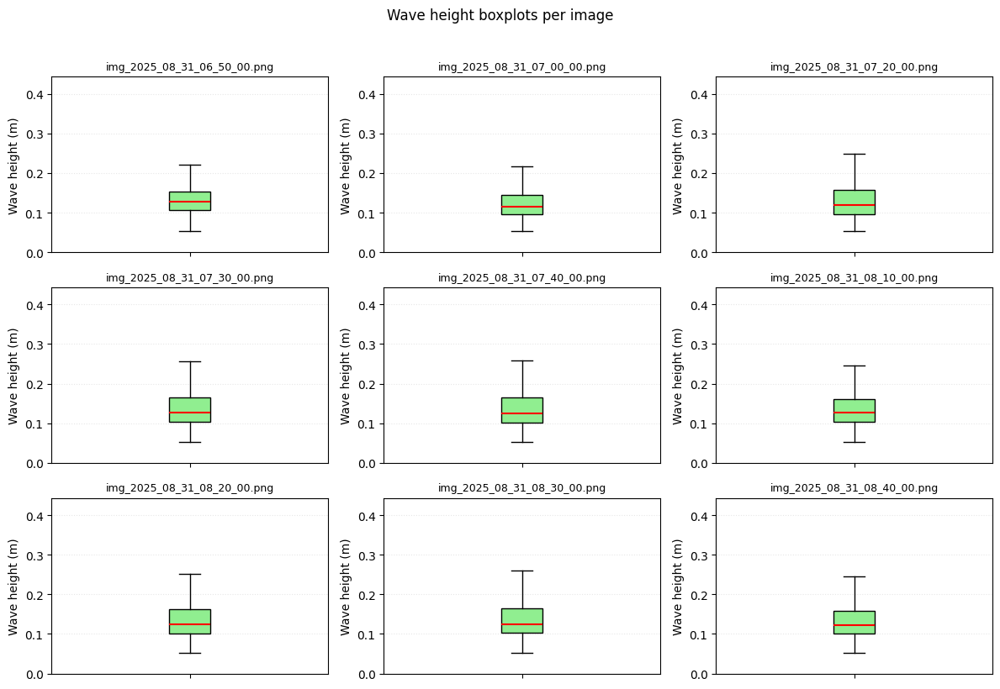

In [20]:
# --- Run both plots ---
plot_wave_boxplots(df, images, ncols=3)

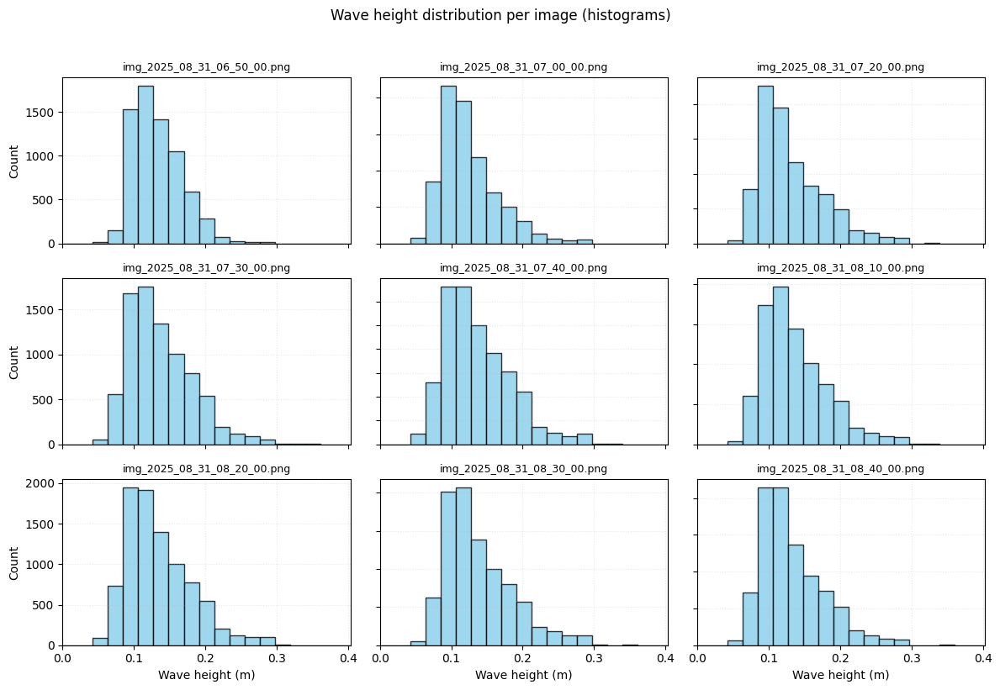

In [21]:
# --- Run both plots ---
plot_wave_distributions(df, images, ncols=3)

## Experiment Deep Learning Model on other webcam image


0: 512x832 700 waves, 85.8ms
Speed: 13.7ms preprocess, 85.8ms inference, 8.7ms postprocess per image at shape (1, 3, 512, 832)
hilterfingen_segelschule.jpg: detected 700 wave boxes.


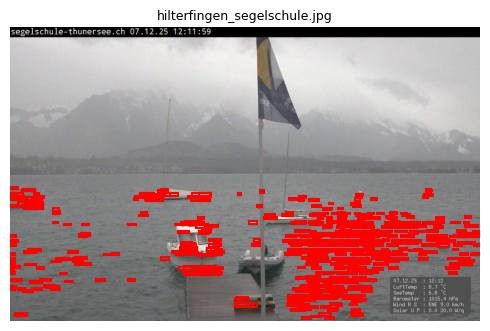

In [28]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Image paths
image_paths = [r"hilterfingen_segelschule.jpg"]  # add more if you like

# YOLO model
YOLO_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
device = "cuda"      # or "cpu"
wave_class_id = 0    # wave class index in your model

yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det = 10000

model = YOLO(YOLO_MODEL_PATH)

# ---------------------------------------------------------
# 2. RUN YOLO ON FULL IMAGES (NO CROP, NO HEIGHTS)
# ---------------------------------------------------------

detections_for_plot = {}   # fname -> list of (x1, y1, x2, y2)
image_cache = {}           # fname -> PIL image (for plotting)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    image_cache[fname] = img
    detections_for_plot[fname] = []

    img_np = np.array(img)

    # YOLO on the FULL image
    try:
        results = model(
            img_np,
            device=device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ YOLO inference failed for {path}: {e}")
        continue

    if len(results) == 0:
        continue

    r = results[0]
    boxes = r.boxes
    if boxes is None or len(boxes) == 0:
        continue

    for box in boxes:
        cls = int(box.cls)
        if cls != wave_class_id:
            continue

        # box coords are now in FULL-image coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
        if x2 <= x1 or y2 <= y1:
            continue

        detections_for_plot[fname].append((x1, y1, x2, y2))

    print(f"{fname}: detected {len(detections_for_plot[fname])} wave boxes.")


# ---------------------------------------------------------
# 3. PLOT FULL IMAGES WITH WAVE BOXES
# ---------------------------------------------------------

n_imgs = len(image_cache)
if n_imgs == 0:
    print("No images to plot.")
else:
    # simple layout: up to 3 columns
    ncols = min(3, n_imgs)
    nrows = int(np.ceil(n_imgs / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    if n_imgs == 1:
        axes = np.array([[axes]])  # make it 2D for uniform indexing
    axes = np.atleast_2d(axes)

    for idx, (fname, img) in enumerate(image_cache.items()):
        row = idx // ncols
        col = idx % ncols
        ax = axes[row, col]

        ax.imshow(img)
        ax.set_title(fname, fontsize=9)
        ax.axis("off")

        # draw red rectangles for each detected wave (full-image coords)
        for (x1, y1, x2, y2) in detections_for_plot.get(fname, []):
            w = x2 - x1
            h = y2 - y1
            rect = plt.Rectangle(
                (x1, y1),
                w,
                h,
                edgecolor="red",
                facecolor="none",
                linewidth=1.5,
            )
            ax.add_patch(rect)

    # hide any unused subplots
    for k in range(idx + 1, nrows * ncols):
        row = k // ncols
        col = k % ncols
        axes[row, col].axis("off")

    plt.tight_layout()
    plt.show()


Masking these classes from nano model: {0: 'person', 8: 'boat', 14: 'bird'}

0: 512x832 1 person, 132 boats, 8 birds, 2 umbrellas, 1 sports ball, 30.5ms
Speed: 10.1ms preprocess, 30.5ms inference, 4.5ms postprocess per image at shape (1, 3, 512, 832)

0: 512x832 700 waves, 42.6ms
Speed: 11.1ms preprocess, 42.6ms inference, 4.3ms postprocess per image at shape (1, 3, 512, 832)
hilterfingen_segelschule.jpg: wave boxes kept = 554, skipped due to masking = 146


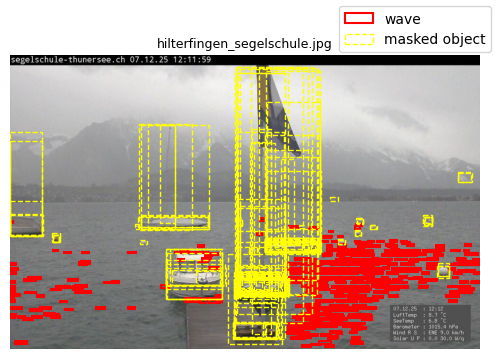

In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Images to process
image_paths = [
    r"hilterfingen_segelschule.jpg",
    # add more images here if you want
]

# 1A) GENERIC / NANO MODEL (for masking non-wave objects)
#    e.g. pretrained COCO model with many classes
MASK_MODEL_PATH = r"yolov8n.pt"   # change to your nano/generic model
mask_device = "cuda"              # or "cpu"

# Classes to EXCLUDE (names as in model_mask.names)
# You will need to adapt these to the actual class names of your model.
MASK_CLASS_NAME_SUBSTRINGS = [
    "person",       # humans
    "boat",         # boats, ships
    "ship",
    "bird",         # birds (covers ducks/swans in generic models)
    "buoy", "steg",   # if you get pets on the pier
    "building", "flag", # if parking is visible
    # Add or remove as needed
]

# 1B) WAVE MODEL (your fine-tuned model)
WAVE_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
wave_device = "cuda"        # or "cpu"
wave_class_id = 0           # wave class index in your fine-tuned model

# YOLO inference params (both models)
yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det = 10000

# IOU threshold for excluding wave boxes overlapping “non-wave” objects
MASK_IOU_THRESHOLD = 0.01   # >0 means *any* overlap rejects the wave box


# ---------------------------------------------------------
# 2. LOAD MODELS
# ---------------------------------------------------------
model_mask = YOLO(MASK_MODEL_PATH)
model_wave = YOLO(WAVE_MODEL_PATH)


# ---------------------------------------------------------
# 3. HELPER FUNCTIONS
# ---------------------------------------------------------
def build_mask_class_ids(model, substrings):
    """
    Map a list of substrings to class IDs in model.names.
    For example: 'boat', 'person', 'bird' etc.
    """
    name_dict = model.names  # {id: "class_name"}
    mask_ids = set()

    for cid, cname in name_dict.items():
        cname_lower = cname.lower()
        for sub in substrings:
            if sub.lower() in cname_lower:
                mask_ids.add(cid)
                break

    print("Masking these classes from nano model:", {cid: name_dict[cid] for cid in sorted(mask_ids)})
    return list(mask_ids)


def box_iou_xyxy(box_a, box_b):
    """Compute IoU between two boxes in (x1, y1, x2, y2) format."""
    x1a, y1a, x2a, y2a = box_a
    x1b, y1b, x2b, y2b = box_b

    xi1 = max(x1a, x1b)
    yi1 = max(y1a, y1b)
    xi2 = min(x2a, x2b)
    yi2 = min(y2a, y2b)

    inter_w = max(0, xi2 - xi1)
    inter_h = max(0, yi2 - yi1)
    inter_area = inter_w * inter_h

    area_a = max(0, x2a - x1a) * max(0, y2a - y1a)
    area_b = max(0, x2b - x1b) * max(0, y2b - y1b)
    union = area_a + area_b - inter_area

    if union <= 0:
        return 0.0
    return inter_area / union


def is_box_blocked(x1, y1, x2, y2, mask_boxes, iou_threshold=MASK_IOU_THRESHOLD):
    """
    Return True if (x1,y1,x2,y2) overlaps any mask box above threshold.
    """
    det_box = (x1, y1, x2, y2)
    for mb in mask_boxes:
        iou = box_iou_xyxy(det_box, mb)
        if iou > iou_threshold:
            return True
    return False


# Build list of class IDs to mask for the generic model
MASK_CLASS_IDS = build_mask_class_ids(model_mask, MASK_CLASS_NAME_SUBSTRINGS)


# ---------------------------------------------------------
# 4. MAIN LOOP: first nano model → then wave model
# ---------------------------------------------------------
image_cache = {}
wave_detections_for_plot = {}   # fname -> list of wave boxes (x1,y1,x2,y2)
mask_boxes_for_plot = {}        # fname -> list of mask boxes (x1,y1,x2,y2)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    image_cache[fname] = img
    img_np = np.array(img)

    # --------------------
    # 4A. RUN NANO MODEL (MASK MODEL)
    # --------------------
    try:
        res_mask = model_mask(
            img_np,
            device=mask_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Mask model inference failed for {path}: {e}")
        continue

    mask_boxes = []
    if len(res_mask) > 0:
        r_m = res_mask[0]
        boxes_m = r_m.boxes
        if boxes_m is not None and len(boxes_m) > 0:
            for box in boxes_m:
                cls_id = int(box.cls)
                if cls_id not in MASK_CLASS_IDS:
                    continue
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue
                mask_boxes.append((x1, y1, x2, y2))

    mask_boxes_for_plot[fname] = mask_boxes

    # --------------------
    # 4B. RUN WAVE MODEL
    # --------------------
    try:
        res_wave = model_wave(
            img_np,
            device=wave_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Wave model inference failed for {path}: {e}")
        continue

    wave_boxes_kept = []
    if len(res_wave) > 0:
        r_w = res_wave[0]
        boxes_w = r_w.boxes
        if boxes_w is not None and len(boxes_w) > 0:
            kept = 0
            skipped = 0
            for box in boxes_w:
                cls_id = int(box.cls)
                if cls_id != wave_class_id:
                    continue

                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue

                # filter out waves overlapping "non-wave" objects
                if is_box_blocked(x1, y1, x2, y2, mask_boxes):
                    skipped += 1
                    continue

                wave_boxes_kept.append((x1, y1, x2, y2))
                kept += 1

            print(f"{fname}: wave boxes kept = {kept}, skipped due to masking = {skipped}")
        else:
            print(f"{fname}: no wave boxes found.")

    wave_detections_for_plot[fname] = wave_boxes_kept


# ---------------------------------------------------------
# 5. PLOT: image + wave boxes + masked objects
# ---------------------------------------------------------
n_imgs = len(image_cache)
if n_imgs == 0:
    print("No images to plot.")
else:
    ncols = min(3, n_imgs)
    nrows = int(np.ceil(n_imgs / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    if n_imgs == 1:
        axes = np.array([[axes]])
    axes = np.atleast_2d(axes)

    for idx, (fname, img) in enumerate(image_cache.items()):
        row = idx // ncols
        col = idx % ncols
        ax = axes[row, col]

        ax.imshow(img)
        ax.set_title(fname, fontsize=9)
        ax.axis("off")

        # Draw wave boxes (kept after masking) in RED
        for (x1, y1, x2, y2) in wave_detections_for_plot.get(fname, []):
            rect_w = plt.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                edgecolor="red",
                facecolor="none",
                linewidth=1.5,
                label="wave" if idx == 0 else None,  # avoid duplicate legend labels
            )
            ax.add_patch(rect_w)

        # Draw masked object boxes in YELLOW (optional, for debugging)
        for (mx1, my1, mx2, my2) in mask_boxes_for_plot.get(fname, []):
            rect_m = plt.Rectangle(
                (mx1, my1),
                mx2 - mx1,
                my2 - my1,
                edgecolor="yellow",
                facecolor="none",
                linewidth=1.0,
                linestyle="--",
                label="masked object" if idx == 0 else None,
            )
            ax.add_patch(rect_m)

    # Build a single legend from first axes (if at least one labeled patch exists)
    handles, labels = [], []
    for ax in axes.ravel():
        h, l = ax.get_legend_handles_labels()
        handles += h
        labels += l
    if handles:
        # deduplicate labels
        uniq = {}
        for h, l in zip(handles, labels):
            if l not in uniq:
                uniq[l] = h
        fig.legend(uniq.values(), uniq.keys(), loc="upper right")

    plt.tight_layout()
    plt.show()


Masking ALL classes from nano model: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]

0: 512x832 1 person, 132 boats, 8 birds, 2 umbrellas, 1 sports ball, 14.5ms
Speed: 7.9ms preprocess, 14.5ms inference, 3.4ms postprocess per image at shape (1, 3, 512, 832)

0: 512x832 700 waves, 30.7ms
Speed: 6.6ms preprocess, 30.7ms inference, 3.4ms postprocess per image at shape (1, 3, 512, 832)
hilterfingen_segelschule.jpg: wave boxes kept = 554, skipped due to masking = 146

0: 512x704 1 person, 14 airplanes, 7 trucks, 26.9ms
Speed: 6.4ms preprocess, 26.9ms inference, 3.2ms postprocess per image at shape (1, 3, 512, 704)

0: 512x704 1470 waves, 25.1ms
Speed: 6.4ms preprocess, 25.1ms inference, 3.4ms postprocess per image at shape (1, 3, 5

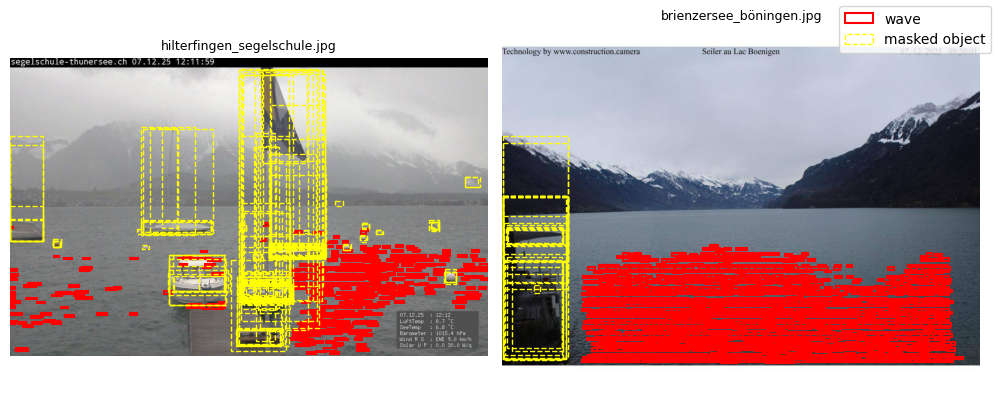

In [35]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Images to process
image_paths = [
    r"hilterfingen_segelschule.jpg",
    r"brienzersee_böningen.jpg"
    # add more images here if you want
]

# 1A) GENERIC / NANO MODEL (for masking non-wave objects)
#    e.g. pretrained COCO model with many classes
MASK_MODEL_PATH = r"yolov8n.pt"   # change to your nano/generic model
mask_device = "cuda"              # or "cpu"

# Classes to EXCLUDE (names as in model_mask.names)
# You will need to adapt these to the actual class names of your model.
#MASK_CLASS_NAME_SUBSTRINGS = [
#    "person",       # humans
#    "boat",         # boats, ships
#    "ship",
#    "bird",         # birds (covers ducks/swans in generic models)
#    "buoy", "dock",   # if you get pets on the pier
#    "building", "flag", # if parking is visible
#   # Add or remove as needed
#]

# 1B) WAVE MODEL (your fine-tuned model)
WAVE_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
wave_device = "cuda"        # or "cpu"
wave_class_id = 0           # wave class index in your fine-tuned model

# YOLO inference params (both models)
yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det = 10000

# IOU threshold for excluding wave boxes overlapping “non-wave” objects
MASK_IOU_THRESHOLD = 0.01   # >0 means *any* overlap rejects the wave box


# ---------------------------------------------------------
# 2. LOAD MODELS
# ---------------------------------------------------------
model_mask = YOLO(MASK_MODEL_PATH)
model_wave = YOLO(WAVE_MODEL_PATH)


# ---------------------------------------------------------
# 3. HELPER FUNCTIONS
# ---------------------------------------------------------
def build_mask_class_ids(model, substrings):
    """
    Map a list of substrings to class IDs in model.names.
    For example: 'boat', 'person', 'bird' etc.
    """
    name_dict = model.names  # {id: "class_name"}
    mask_ids = set()

    for cid, cname in name_dict.items():
        cname_lower = cname.lower()
        for sub in substrings:
            if sub.lower() in cname_lower:
                mask_ids.add(cid)
                break

    print("Masking these classes from nano model:", {cid: name_dict[cid] for cid in sorted(mask_ids)})
    return list(mask_ids)


def box_iou_xyxy(box_a, box_b):
    """Compute IoU between two boxes in (x1, y1, x2, y2) format."""
    x1a, y1a, x2a, y2a = box_a
    x1b, y1b, x2b, y2b = box_b

    xi1 = max(x1a, x1b)
    yi1 = max(y1a, y1b)
    xi2 = min(x2a, x2b)
    yi2 = min(y2a, y2b)

    inter_w = max(0, xi2 - xi1)
    inter_h = max(0, yi2 - yi1)
    inter_area = inter_w * inter_h

    area_a = max(0, x2a - x1a) * max(0, y2a - y1a)
    area_b = max(0, x2b - x1b) * max(0, y2b - y1b)
    union = area_a + area_b - inter_area

    if union <= 0:
        return 0.0
    return inter_area / union


def is_box_blocked(x1, y1, x2, y2, mask_boxes, iou_threshold=MASK_IOU_THRESHOLD):
    """
    Return True if (x1,y1,x2,y2) overlaps any mask box above threshold.
    """
    det_box = (x1, y1, x2, y2)
    for mb in mask_boxes:
        iou = box_iou_xyxy(det_box, mb)
        if iou > iou_threshold:
            return True
    return False


# Build list of class IDs to mask for the generic model
#MASK_CLASS_IDS = build_mask_class_ids(model_mask, MASK_CLASS_NAME_SUBSTRINGS)

# Mask ALL objects detected by the generic YOLO model
MASK_CLASS_IDS = list(model_mask.names.keys())

print("Masking ALL classes from nano model:", MASK_CLASS_IDS)

# ---------------------------------------------------------
# 4. MAIN LOOP: first nano model → then wave model
# ---------------------------------------------------------
image_cache = {}
wave_detections_for_plot = {}   # fname -> list of wave boxes (x1,y1,x2,y2)
mask_boxes_for_plot = {}        # fname -> list of mask boxes (x1,y1,x2,y2)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    image_cache[fname] = img
    img_np = np.array(img)

    # --------------------
    # 4A. RUN NANO MODEL (MASK MODEL)
    # --------------------
    try:
        res_mask = model_mask(
            img_np,
            device=mask_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Mask model inference failed for {path}: {e}")
        continue

    mask_boxes = []
    if len(res_mask) > 0:
        r_m = res_mask[0]
        boxes_m = r_m.boxes
        if boxes_m is not None and len(boxes_m) > 0:
            for box in boxes_m:
                cls_id = int(box.cls)
                if cls_id not in MASK_CLASS_IDS:
                    continue
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue
                mask_boxes.append((x1, y1, x2, y2))

    mask_boxes_for_plot[fname] = mask_boxes

    # --------------------
    # 4B. RUN WAVE MODEL
    # --------------------
    try:
        res_wave = model_wave(
            img_np,
            device=wave_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Wave model inference failed for {path}: {e}")
        continue

    wave_boxes_kept = []
    if len(res_wave) > 0:
        r_w = res_wave[0]
        boxes_w = r_w.boxes
        if boxes_w is not None and len(boxes_w) > 0:
            kept = 0
            skipped = 0
            for box in boxes_w:
                cls_id = int(box.cls)
                if cls_id != wave_class_id:
                    continue

                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue

                # filter out waves overlapping "non-wave" objects
                if is_box_blocked(x1, y1, x2, y2, mask_boxes):
                    skipped += 1
                    continue

                wave_boxes_kept.append((x1, y1, x2, y2))
                kept += 1

            print(f"{fname}: wave boxes kept = {kept}, skipped due to masking = {skipped}")
        else:
            print(f"{fname}: no wave boxes found.")

    wave_detections_for_plot[fname] = wave_boxes_kept


# ---------------------------------------------------------
# 5. PLOT: image + wave boxes + masked objects
# ---------------------------------------------------------
n_imgs = len(image_cache)
if n_imgs == 0:
    print("No images to plot.")
else:
    ncols = min(3, n_imgs)
    nrows = int(np.ceil(n_imgs / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    if n_imgs == 1:
        axes = np.array([[axes]])
    axes = np.atleast_2d(axes)

    for idx, (fname, img) in enumerate(image_cache.items()):
        row = idx // ncols
        col = idx % ncols
        ax = axes[row, col]

        ax.imshow(img)
        ax.set_title(fname, fontsize=9)
        ax.axis("off")

        # Draw wave boxes (kept after masking) in RED
        for (x1, y1, x2, y2) in wave_detections_for_plot.get(fname, []):
            rect_w = plt.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                edgecolor="red",
                facecolor="none",
                linewidth=1.5,
                label="wave" if idx == 0 else None,  # avoid duplicate legend labels
            )
            ax.add_patch(rect_w)

        # Draw masked object boxes in YELLOW (optional, for debugging)
        for (mx1, my1, mx2, my2) in mask_boxes_for_plot.get(fname, []):
            rect_m = plt.Rectangle(
                (mx1, my1),
                mx2 - mx1,
                my2 - my1,
                edgecolor="yellow",
                facecolor="none",
                linewidth=1.0,
                linestyle="--",
                label="masked object" if idx == 0 else None,
            )
            ax.add_patch(rect_m)

    # Build a single legend from first axes (if at least one labeled patch exists)
    handles, labels = [], []
    for ax in axes.ravel():
        h, l = ax.get_legend_handles_labels()
        handles += h
        labels += l
    if handles:
        # deduplicate labels
        uniq = {}
        for h, l in zip(handles, labels):
            if l not in uniq:
                uniq[l] = h
        fig.legend(uniq.values(), uniq.keys(), loc="upper right")

    plt.tight_layout()
    plt.show()


Masking ALL classes from nano model: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]

0: 512x928 3 persons, 35 cars, 11 trains, 6 trucks, 4 boats, 1 fire hydrant, 31 benchs, 3 potted plants, 16.5ms
Speed: 8.8ms preprocess, 16.5ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 928)

0: 512x928 20 waves, 32.9ms
Speed: 7.7ms preprocess, 32.9ms inference, 2.8ms postprocess per image at shape (1, 3, 512, 928)
faulensee_richtung_gunten_thunersee.jpg: wave boxes kept = 20, skipped due to masking = 0

0: 384x2048 44 persons, 57 cars, 18 airplanes, 4 buss, 35 trains, 17 trucks, 51 boats, 1 traffic light, 1 fire hydrant, 5 benchs, 7 birds, 2 cows, 1 umbrella, 3 suitcases, 1 bottle, 1 dining table, 24 books, 23.3ms
Speed: 13.

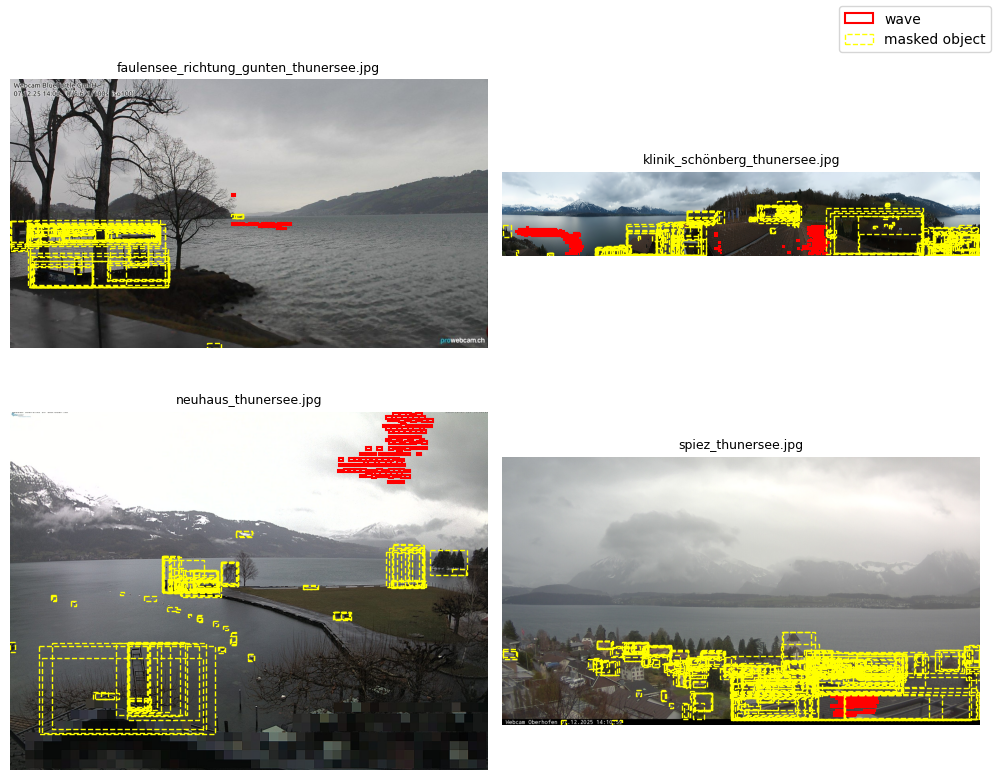

In [38]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Images to process
image_paths = [
    r"faulensee_richtung_gunten_thunersee.jpg",
    r"klinik_schönberg_thunersee.jpg",
    r"neuhaus_thunersee.jpg",
    r"spiez_thunersee.jpg"
]

# 1A) GENERIC / NANO MODEL (for masking non-wave objects)
#    e.g. pretrained COCO model with many classes
MASK_MODEL_PATH = r"yolov8n.pt"   # change to your nano/generic model
mask_device = "cuda"              # or "cpu"

# Classes to EXCLUDE (names as in model_mask.names)
# You will need to adapt these to the actual class names of your model.
#MASK_CLASS_NAME_SUBSTRINGS = [
#    "person",       # humans
#    "boat",         # boats, ships
#    "ship",
#    "bird",         # birds (covers ducks/swans in generic models)
#    "buoy", "dock",   # if you get pets on the pier
#    "building", "flag", # if parking is visible
#   # Add or remove as needed
#]

# 1B) WAVE MODEL (your fine-tuned model)
WAVE_MODEL_PATH = r"03_waves_yolov8s-1000_150e.pt"
wave_device = "cuda"        # or "cpu"
wave_class_id = 0           # wave class index in your fine-tuned model

# YOLO inference params (both models)
yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det = 10000

# IOU threshold for excluding wave boxes overlapping “non-wave” objects
MASK_IOU_THRESHOLD = 0.01   # >0 means *any* overlap rejects the wave box


# ---------------------------------------------------------
# 2. LOAD MODELS
# ---------------------------------------------------------
model_mask = YOLO(MASK_MODEL_PATH)
model_wave = YOLO(WAVE_MODEL_PATH)


# ---------------------------------------------------------
# 3. HELPER FUNCTIONS
# ---------------------------------------------------------
def build_mask_class_ids(model, substrings):
    """
    Map a list of substrings to class IDs in model.names.
    For example: 'boat', 'person', 'bird' etc.
    """
    name_dict = model.names  # {id: "class_name"}
    mask_ids = set()

    for cid, cname in name_dict.items():
        cname_lower = cname.lower()
        for sub in substrings:
            if sub.lower() in cname_lower:
                mask_ids.add(cid)
                break

    print("Masking these classes from nano model:", {cid: name_dict[cid] for cid in sorted(mask_ids)})
    return list(mask_ids)


def box_iou_xyxy(box_a, box_b):
    """Compute IoU between two boxes in (x1, y1, x2, y2) format."""
    x1a, y1a, x2a, y2a = box_a
    x1b, y1b, x2b, y2b = box_b

    xi1 = max(x1a, x1b)
    yi1 = max(y1a, y1b)
    xi2 = min(x2a, x2b)
    yi2 = min(y2a, y2b)

    inter_w = max(0, xi2 - xi1)
    inter_h = max(0, yi2 - yi1)
    inter_area = inter_w * inter_h

    area_a = max(0, x2a - x1a) * max(0, y2a - y1a)
    area_b = max(0, x2b - x1b) * max(0, y2b - y1b)
    union = area_a + area_b - inter_area

    if union <= 0:
        return 0.0
    return inter_area / union


def is_box_blocked(x1, y1, x2, y2, mask_boxes, iou_threshold=MASK_IOU_THRESHOLD):
    """
    Return True if (x1,y1,x2,y2) overlaps any mask box above threshold.
    """
    det_box = (x1, y1, x2, y2)
    for mb in mask_boxes:
        iou = box_iou_xyxy(det_box, mb)
        if iou > iou_threshold:
            return True
    return False


# Build list of class IDs to mask for the generic model
#MASK_CLASS_IDS = build_mask_class_ids(model_mask, MASK_CLASS_NAME_SUBSTRINGS)

# Mask ALL objects detected by the generic YOLO model
MASK_CLASS_IDS = list(model_mask.names.keys())

print("Masking ALL classes from nano model:", MASK_CLASS_IDS)

# ---------------------------------------------------------
# 4. MAIN LOOP: first nano model → then wave model
# ---------------------------------------------------------
image_cache = {}
wave_detections_for_plot = {}   # fname -> list of wave boxes (x1,y1,x2,y2)
mask_boxes_for_plot = {}        # fname -> list of mask boxes (x1,y1,x2,y2)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    image_cache[fname] = img
    img_np = np.array(img)

    # --------------------
    # 4A. RUN NANO MODEL (MASK MODEL)
    # --------------------
    try:
        res_mask = model_mask(
            img_np,
            device=mask_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Mask model inference failed for {path}: {e}")
        continue

    mask_boxes = []
    if len(res_mask) > 0:
        r_m = res_mask[0]
        boxes_m = r_m.boxes
        if boxes_m is not None and len(boxes_m) > 0:
            for box in boxes_m:
                cls_id = int(box.cls)
                if cls_id not in MASK_CLASS_IDS:
                    continue
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue
                mask_boxes.append((x1, y1, x2, y2))

    mask_boxes_for_plot[fname] = mask_boxes

    # --------------------
    # 4B. RUN WAVE MODEL
    # --------------------
    try:
        res_wave = model_wave(
            img_np,
            device=wave_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Wave model inference failed for {path}: {e}")
        continue

    wave_boxes_kept = []
    if len(res_wave) > 0:
        r_w = res_wave[0]
        boxes_w = r_w.boxes
        if boxes_w is not None and len(boxes_w) > 0:
            kept = 0
            skipped = 0
            for box in boxes_w:
                cls_id = int(box.cls)
                if cls_id != wave_class_id:
                    continue

                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue

                # filter out waves overlapping "non-wave" objects
                if is_box_blocked(x1, y1, x2, y2, mask_boxes):
                    skipped += 1
                    continue

                wave_boxes_kept.append((x1, y1, x2, y2))
                kept += 1

            print(f"{fname}: wave boxes kept = {kept}, skipped due to masking = {skipped}")
        else:
            print(f"{fname}: no wave boxes found.")

    wave_detections_for_plot[fname] = wave_boxes_kept


# ---------------------------------------------------------
# 5. PLOT: image + wave boxes + masked objects
# ---------------------------------------------------------
n_imgs = len(image_cache)
if n_imgs == 0:
    print("No images to plot.")
else:
    ncols = min(2, n_imgs)
    nrows = int(np.ceil(n_imgs / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    if n_imgs == 1:
        axes = np.array([[axes]])
    axes = np.atleast_2d(axes)

    for idx, (fname, img) in enumerate(image_cache.items()):
        row = idx // ncols
        col = idx % ncols
        ax = axes[row, col]

        ax.imshow(img)
        ax.set_title(fname, fontsize=9)
        ax.axis("off")

        # Draw wave boxes (kept after masking) in RED
        for (x1, y1, x2, y2) in wave_detections_for_plot.get(fname, []):
            rect_w = plt.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                edgecolor="red",
                facecolor="none",
                linewidth=1.5,
                label="wave" if idx == 0 else None,  # avoid duplicate legend labels
            )
            ax.add_patch(rect_w)

        # Draw masked object boxes in YELLOW (optional, for debugging)
        for (mx1, my1, mx2, my2) in mask_boxes_for_plot.get(fname, []):
            rect_m = plt.Rectangle(
                (mx1, my1),
                mx2 - mx1,
                my2 - my1,
                edgecolor="yellow",
                facecolor="none",
                linewidth=1.0,
                linestyle="--",
                label="masked object" if idx == 0 else None,
            )
            ax.add_patch(rect_m)

    # Build a single legend from first axes (if at least one labeled patch exists)
    handles, labels = [], []
    for ax in axes.ravel():
        h, l = ax.get_legend_handles_labels()
        handles += h
        labels += l
    if handles:
        # deduplicate labels
        uniq = {}
        for h, l in zip(handles, labels):
            if l not in uniq:
                uniq[l] = h
        fig.legend(uniq.values(), uniq.keys(), loc="upper right")

    plt.tight_layout()
    plt.show()


Masking ALL classes from nano model: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]

0: 384x2048 95 persons, 20 cars, 1 airplane, 14 trucks, 139 boats, 1 traffic light, 23 benchs, 11 birds, 10 umbrellas, 4 chairs, 417.6ms
Speed: 15.1ms preprocess, 417.6ms inference, 27.8ms postprocess per image at shape (1, 3, 384, 2048)

0: 384x2048 443 waves, 817.8ms
Speed: 16.1ms preprocess, 817.8ms inference, 27.5ms postprocess per image at shape (1, 3, 384, 2048)
klinik_schönberg_thunersee_sun2.jpg: wave boxes kept = 441, skipped due to masking = 2

0: 384x2048 44 persons, 57 cars, 18 airplanes, 4 buss, 35 trains, 17 trucks, 51 boats, 1 traffic light, 1 fire hydrant, 5 benchs, 7 birds, 2 cows, 1 umbrella, 3 suitcases, 1 bottle, 1 dining t

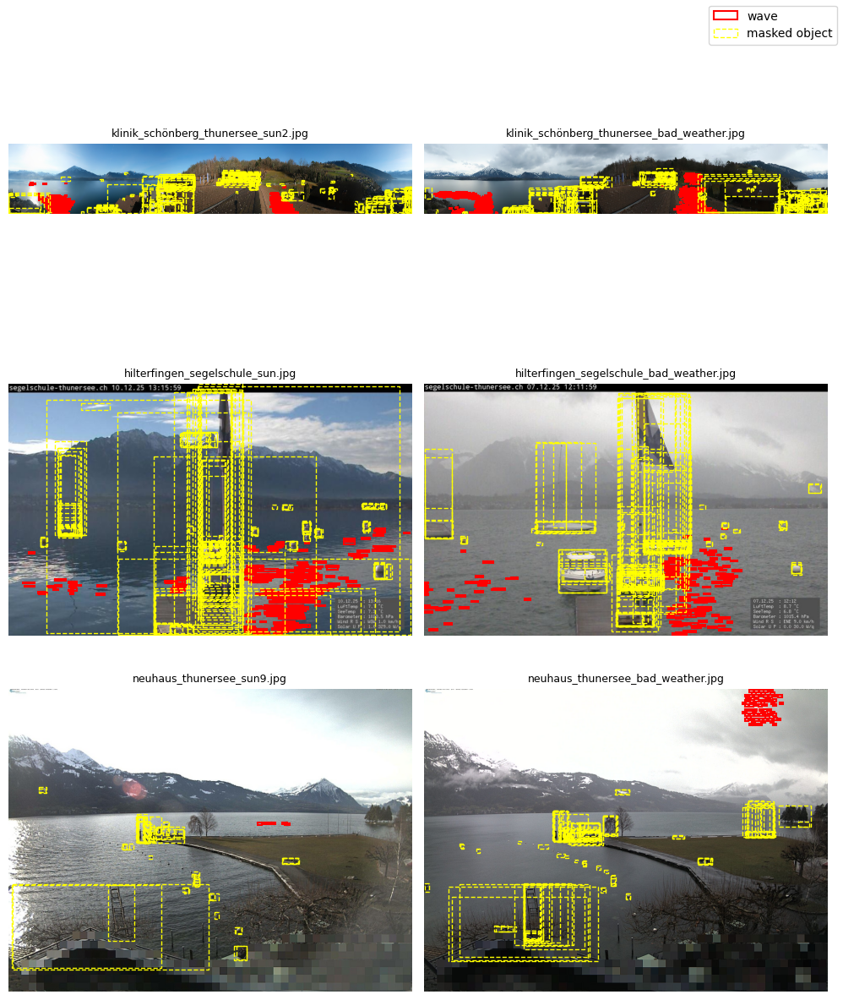

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

from PIL import Image
from ultralytics import YOLO  # pip install ultralytics


# ---------------------------------------------------------
# 1. CONFIGURATION
# ---------------------------------------------------------

# Images to process
image_paths = [
    r"klinik_schönberg_thunersee_sun2.jpg",
    r"klinik_schönberg_thunersee_bad_weather.jpg",
    r"hilterfingen_segelschule_sun.jpg",
    r"hilterfingen_segelschule_bad_weather.jpg",
    r"neuhaus_thunersee_sun9.jpg",
    r"neuhaus_thunersee_bad_weather.jpg"
]

# 1A) GENERIC / NANO MODEL (for masking non-wave objects)
#    e.g. pretrained COCO model with many classes
MASK_MODEL_PATH = r"yolov8n.pt"   # change to your nano/generic model
mask_device = "cuda"              # or "cpu"

# Classes to EXCLUDE (names as in model_mask.names)
# You will need to adapt these to the actual class names of your model.
#MASK_CLASS_NAME_SUBSTRINGS = [
#    "person",       # humans
#    "boat",         # boats, ships
#    "ship",
#    "bird",         # birds (covers ducks/swans in generic models)
#    "buoy", "dock",   # if you get pets on the pier
#    "building", "flag", # if parking is visible
#   # Add or remove as needed
#]

# 1B) WAVE MODEL (your fine-tuned model)
WAVE_MODEL_PATH = r"04_waves_yolov8s-5000_150e.pt"
wave_device = "cuda"        # or "cpu"
wave_class_id = 0           # wave class index in your fine-tuned model

# YOLO inference params (both models)
yolo_conf = 0.005
yolo_iou = 0.9
yolo_imgsz = (512, 2048)
max_det = 10000

# IOU threshold for excluding wave boxes overlapping “non-wave” objects
MASK_IOU_THRESHOLD = 0.01   # >0 means *any* overlap rejects the wave box


# ---------------------------------------------------------
# 2. LOAD MODELS
# ---------------------------------------------------------
model_mask = YOLO(MASK_MODEL_PATH)
model_wave = YOLO(WAVE_MODEL_PATH)


# ---------------------------------------------------------
# 3. HELPER FUNCTIONS
# ---------------------------------------------------------
def build_mask_class_ids(model, substrings):
    """
    Map a list of substrings to class IDs in model.names.
    For example: 'boat', 'person', 'bird' etc.
    """
    name_dict = model.names  # {id: "class_name"}
    mask_ids = set()

    for cid, cname in name_dict.items():
        cname_lower = cname.lower()
        for sub in substrings:
            if sub.lower() in cname_lower:
                mask_ids.add(cid)
                break

    print("Masking these classes from nano model:", {cid: name_dict[cid] for cid in sorted(mask_ids)})
    return list(mask_ids)


def box_iou_xyxy(box_a, box_b):
    """Compute IoU between two boxes in (x1, y1, x2, y2) format."""
    x1a, y1a, x2a, y2a = box_a
    x1b, y1b, x2b, y2b = box_b

    xi1 = max(x1a, x1b)
    yi1 = max(y1a, y1b)
    xi2 = min(x2a, x2b)
    yi2 = min(y2a, y2b)

    inter_w = max(0, xi2 - xi1)
    inter_h = max(0, yi2 - yi1)
    inter_area = inter_w * inter_h

    area_a = max(0, x2a - x1a) * max(0, y2a - y1a)
    area_b = max(0, x2b - x1b) * max(0, y2b - y1b)
    union = area_a + area_b - inter_area

    if union <= 0:
        return 0.0
    return inter_area / union


def is_box_blocked(x1, y1, x2, y2, mask_boxes, iou_threshold=MASK_IOU_THRESHOLD):
    """
    Return True if (x1,y1,x2,y2) overlaps any mask box above threshold.
    """
    det_box = (x1, y1, x2, y2)
    for mb in mask_boxes:
        iou = box_iou_xyxy(det_box, mb)
        if iou > iou_threshold:
            return True
    return False


# Build list of class IDs to mask for the generic model
#MASK_CLASS_IDS = build_mask_class_ids(model_mask, MASK_CLASS_NAME_SUBSTRINGS)

# Mask ALL objects detected by the generic YOLO model
MASK_CLASS_IDS = list(model_mask.names.keys())

print("Masking ALL classes from nano model:", MASK_CLASS_IDS)

# ---------------------------------------------------------
# 4. MAIN LOOP: first nano model → then wave model
# ---------------------------------------------------------
image_cache = {}
wave_detections_for_plot = {}   # fname -> list of wave boxes (x1,y1,x2,y2)
mask_boxes_for_plot = {}        # fname -> list of mask boxes (x1,y1,x2,y2)

for path in image_paths:
    fname = os.path.basename(path)

    try:
        img = Image.open(path).convert("RGB")
    except Exception as e:
        print(f"⚠️ Could not open {path}: {e}")
        continue

    image_cache[fname] = img
    img_np = np.array(img)

    # --------------------
    # 4A. RUN NANO MODEL (MASK MODEL)
    # --------------------
    try:
        res_mask = model_mask(
            img_np,
            device=mask_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Mask model inference failed for {path}: {e}")
        continue

    mask_boxes = []
    if len(res_mask) > 0:
        r_m = res_mask[0]
        boxes_m = r_m.boxes
        if boxes_m is not None and len(boxes_m) > 0:
            for box in boxes_m:
                cls_id = int(box.cls)
                if cls_id not in MASK_CLASS_IDS:
                    continue
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue
                mask_boxes.append((x1, y1, x2, y2))

    mask_boxes_for_plot[fname] = mask_boxes

    # --------------------
    # 4B. RUN WAVE MODEL
    # --------------------
    try:
        res_wave = model_wave(
            img_np,
            device=wave_device,
            conf=yolo_conf,
            iou=yolo_iou,
            imgsz=yolo_imgsz,
            max_det=max_det,
        )
    except Exception as e:
        print(f"⚠️ Wave model inference failed for {path}: {e}")
        continue

    wave_boxes_kept = []
    if len(res_wave) > 0:
        r_w = res_wave[0]
        boxes_w = r_w.boxes
        if boxes_w is not None and len(boxes_w) > 0:
            kept = 0
            skipped = 0
            for box in boxes_w:
                cls_id = int(box.cls)
                if cls_id != wave_class_id:
                    continue

                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
                if x2 <= x1 or y2 <= y1:
                    continue

                # filter out waves overlapping "non-wave" objects
                if is_box_blocked(x1, y1, x2, y2, mask_boxes):
                    skipped += 1
                    continue

                wave_boxes_kept.append((x1, y1, x2, y2))
                kept += 1

            print(f"{fname}: wave boxes kept = {kept}, skipped due to masking = {skipped}")
        else:
            print(f"{fname}: no wave boxes found.")

    wave_detections_for_plot[fname] = wave_boxes_kept


# ---------------------------------------------------------
# 5. PLOT: image + wave boxes + masked objects
# ---------------------------------------------------------
n_imgs = len(image_cache)
if n_imgs == 0:
    print("No images to plot.")
else:
    ncols = min(2, n_imgs)
    nrows = int(np.ceil(n_imgs / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
    if n_imgs == 1:
        axes = np.array([[axes]])
    axes = np.atleast_2d(axes)

    for idx, (fname, img) in enumerate(image_cache.items()):
        row = idx // ncols
        col = idx % ncols
        ax = axes[row, col]

        ax.imshow(img)
        ax.set_title(fname, fontsize=9)
        ax.axis("off")

        # Draw wave boxes (kept after masking) in RED
        for (x1, y1, x2, y2) in wave_detections_for_plot.get(fname, []):
            rect_w = plt.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                edgecolor="red",
                facecolor="none",
                linewidth=1.5,
                label="wave" if idx == 0 else None,  # avoid duplicate legend labels
            )
            ax.add_patch(rect_w)

        # Draw masked object boxes in YELLOW (optional, for debugging)
        for (mx1, my1, mx2, my2) in mask_boxes_for_plot.get(fname, []):
            rect_m = plt.Rectangle(
                (mx1, my1),
                mx2 - mx1,
                my2 - my1,
                edgecolor="yellow",
                facecolor="none",
                linewidth=1.0,
                linestyle="--",
                label="masked object" if idx == 0 else None,
            )
            ax.add_patch(rect_m)

    # Build a single legend from first axes (if at least one labeled patch exists)
    handles, labels = [], []
    for ax in axes.ravel():
        h, l = ax.get_legend_handles_labels()
        handles += h
        labels += l
    if handles:
        # deduplicate labels
        uniq = {}
        for h, l in zip(handles, labels):
            if l not in uniq:
                uniq[l] = h
        fig.legend(uniq.values(), uniq.keys(), loc="upper right")

    save_plot = os.path.join("NR_Generalization_YOLO8S-5000.png")
    plt.savefig(save_plot, dpi=300)

    plt.tight_layout()
    plt.show()
